# Script to aquire and pre-process all data for the model

Very useful packages:
- https://samgeo.gishub.org/installation/ to convert TMS to GeoTIFF and  also to segment satellite images in general
- https://gdal.org/en/stable/programs/gdal_translate.html to convert geodata formats 
- https://rasterio.readthedocs.io/en/stable/ to rasterize OSM vector data or to visualize a raster
- https://osmnx.readthedocs.io/en/stable/ to easily download OSM data
- https://geopandas.org/en/stable/ to handle vector data
- https://docs.xarray.dev/en/stable/ for cube handling of raster data

In [14]:
## Import libraries
# system
import os
import sys
import time
import calendar
import io
import requests
import multiprocessing as mp
from concurrent.futures import ThreadPoolExecutor, as_completed
import threading
from dotenv import load_dotenv


# aws bucket access
import boto3

# data manipulation
import json
import random
from PIL import Image
from io import BytesIO
import numpy as np
import pandas as pd
import geopandas as gpd
import osmnx as ox
import rasterio as rio
import xarray as xr
import rioxarray as rxr
from rasterio.transform import from_bounds
from rasterio.features import geometry_mask, rasterize
from pyproj import Transformer, CRS
from shapely.geometry import box, shape, Polygon
#from samgeo import tms_to_geotiff

# visualization
from rasterio.plot import show
import leafmap
import folium
from ipyleaflet import Map, WMSLayer, basemaps, TileLayer, DrawControl, FullScreenControl, LayersControl, MeasureControl, SplitMapControl, WidgetControl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib as mpl
import seaborn as sns
from tqdm import tqdm

repo_name = 'masterthesis_genai_spatialplan'
if not repo_name in os.getcwd():
    os.chdir(repo_name)

p=os.popen('git rev-parse --show-toplevel')
repo_dir = p.read().strip()
p.close()

# Load .env file
load_dotenv(dotenv_path=f"{repo_dir}/.env")

#seaborn cmap
rocket=sns.color_palette("rocket", as_cmap=True)
mako=sns.color_palette("mako", as_cmap=True)

In [ ]:
sys.path.append("/usr/share/lmod/lmod/init")
from env_modules_python import module

# loading cluster modules
gdal_root = "/software/easybuild/el8/amd_zen3/all/GDAL/3.9.0-foss-2023b"
cuda_root = "/software/easybuild/el8/amd_zen3/all/CUDA/12.6.0"

module("load", "CUDA")
module("load", "GDAL")

os.environ["PATH"] = f"{cuda_root}/bin:{os.environ['PATH']}"
os.environ["LD_LIBRARY_PATH"] = f"{cuda_root}/lib:{os.environ.get('LD_LIBRARY_PATH', '')}"
os.environ["CUDA_HOME"] = cuda_root
os.environ["CUDA_PATH"] = cuda_root

# GDAL setup with corrected paths
os.environ["PATH"] = f"{gdal_root}/bin:{os.environ['PATH']}"
os.environ["LD_LIBRARY_PATH"] = f"{gdal_root}/lib64:{gdal_root}/lib:{os.environ.get('LD_LIBRARY_PATH', '')}"
os.environ["GDAL_DATA"] = f"{gdal_root}/share/gdal"
os.environ["GDAL_DRIVER_PATH"] = f"{gdal_root}/lib64/gdalplugins"
print("GDAL is available: ", os.system("gdalinfo --version")) # Test GDAL

# os.environ["PATH"] = f"{gdal_root}/bin:" + os.environ["PATH"]
# os.environ["LD_LIBRARY_PATH"] = f"{gdal_root}/lib:" + os.environ.get("LD_LIBRARY_PATH", "")
# os.environ["GDAL_DATA"] = f"{gdal_root}/share/gdal"
# os.environ["GDAL_DRIVER_PATH"] = f"{gdal_root}/lib/gdalplugins"

GDAL 3.9.0, released 2024/05/07
GDAL is available:  0


### Get the boundaries of Leipzig

In [3]:
# Define bbox for entire Leipzig
xmin, ymin = 12.2714, 51.2705  # Southwest corner
xmax, ymax = 12.5019, 51.4174  # Northeast corner

# Create bbox polygon
bbox = box(xmin, ymin, xmax, ymax)

# Create GeoDataFrame
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs="EPSG:4326")

bbox_gdf.explore()

### Stadt Leipzig Orthophoto (WMS)

The city of Leipzig created orthophotos of the city in spring 2022: https://www.leipzig.de/bauen-und-wohnen/bauen/geodaten-und-karten/luftbilder-und-orthophotos

The photos are available as a WMS layer under: https://geodienste.leipzig.de/l4/Luftbild_2022/service?request=getCapabilities


In [137]:
# leipzig center
center = [51.340632, 12.374732]
zoom = 13
m = leafmap.Map(center=center, zoom=zoom)
m

Map(center=[51.340632, 12.374732], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

In [ ]:
#to get drawn areas
m.user_roi_bounds()

[12.3735, 51.324, 12.3935, 51.3321]

Using ipyleaflet

In [138]:
# leipzig center
center = [51.340632, 12.374732]
zoom = 13
m = Map(basemap=basemaps.CartoDB.Positron, center=center, zoom=zoom)

#add layer control
m.add_control(LayersControl())
m.add_control(DrawControl())

m

Map(center=[51.340632, 12.374732], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

In [139]:
wms = WMSLayer(
    url='https://geodienste.leipzig.de/l4/Luftbild_2022/service',
    layers='Luftbild_2022',
    name='Luftbild 2022',
    format='image/png',
    transparent=True,
    attribution='Stadt Leipzig',
)
m.add_layer(wms)

In [140]:
source_url_google = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}'
google_tiles = TileLayer(url=source_url_google, name='Google Satellite')
m.add_layer(google_tiles)

In [ ]:
bounds = [xmin, ymin, xmax, ymax]
tms_to_geotiff(bbox=bounds, output='google_satellite.tif', source=source_url_google, zoom=13)

In [ ]:
def fix_bbox_coordinates(lat1, lon1, lat2, lon2):
    # Create transformer from EPSG:4326 to EPSG:3857
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
    
    # Transform coordinates
    x1, y1 = transformer.transform(lon1, lat1)
    x2, y2 = transformer.transform(lon2, lat2)
    
    # Ensure min/max values are in correct order
    min_x, max_x = min(x1, x2), max(x1, x2)
    min_y, max_y = min(y1, y2), max(y1, y2)
    
    return f"{min_x},{min_y},{max_x},{max_y}"

def get_wms_image(bounds, output_tif):
    
    if not os.path.exists(output_tif):
        os.makedirs(os.path.dirname(output_tif), exist_ok=True)
    else:
        return
    
    # Parse bounds [xmin, ymin, xmax, ymax]
    ulx, lry, lrx, uly = bounds
    bbox = fix_bbox_coordinates(uly, ulx, lry, lrx)
    
    url = (
        "https://geodienste.leipzig.de/l4/Luftbild_2022/service"
        f"?SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap"
        f"&BBOX={bbox}"
        "&CRS=EPSG:3857"
        "&WIDTH=1024&HEIGHT=1024"
        "&LAYERS=Luftbild_2022&STYLES="
        "&FORMAT=image/png"
    )
    #print(url)
    
    # Download image
    response = requests.get(url)
    if not response.ok:
        raise ValueError(f"WMS request failed: {response.status_code}")
        
    # Verify PNG is valid
    img = Image.open(BytesIO(response.content))
    png_path = output_tif.replace(".tif", ".png")
    img.save(png_path)
    
    # Create georeferenced TIF
    transform = from_bounds(ulx, lry, lrx, uly, 1024, 1024)
    
    # Specify driver explicitly for PNG
    with rio.open(
        png_path,
        'r',
        driver='PNG'
    ) as src:
        profile = src.profile
        profile.update({
            'crs': CRS.from_epsg(3857),
            'transform': transform
        })
        
        with rio.open(output_tif, 'w', **profile) as dst:
            dst.write(src.read())
    
    os.system(f"rm -rf {png_path}")

In [11]:
# xmin, ymin, xmax, ymax = gdf.total_bounds
length = 0.005
width = 0.005

cols = list(np.arange(xmin, xmax + width, width))
rows = list(np.arange(ymin, ymax +length, length))

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([
            (x, y), (x+width, y), (x+width, y+length), (x, y+length)
        ]))
grid = gpd.GeoDataFrame(geometry=polygons, crs="EPSG:4326")
# grid =gpd.overlay(grid, gdf, how='intersection')
grid.explore()

In [ ]:
def wrap_image_download(geometry):
    bounds = geometry.bounds
    xmin, ymin, xmax, ymax = [str(coord).replace(".", "") for coord in bounds]

    try:
        get_wms_image(bounds, f"{repo_dir}/data/leipzig_aerial_grid/lz_aerial_{xmin}_{ymin}_{xmax}_{ymax}.tif")
    except Exception as e:
        print(f"Failed to download image for {bounds}: {e}")

if __name__ == "__main__":
    
    processes =  int(mp.cpu_count()*0.9)
    # multiprocess grid using tqdm
    with mp.Pool(processes) as pool:
        list(tqdm(pool.imap(wrap_image_download, grid.geometry), total=len(grid)))

  2%|▏         | 22/1410 [00:50<42:59,  1.86s/it] 

Failed to download image for (12.281400000000001, 51.37050000000005, 12.286400000000002, 51.37550000000005): WMS request failed: 504Failed to download image for (12.281400000000001, 51.32550000000003, 12.286400000000002, 51.33050000000003): WMS request failed: 504Failed to download image for (12.281400000000001, 51.39050000000006, 12.286400000000002, 51.39550000000006): WMS request failed: 504
Failed to download image for (12.281400000000001, 51.2805, 12.286400000000002, 51.285500000000006): WMS request failed: 504Failed to download image for (12.2764, 51.37550000000005, 12.281400000000001, 51.380500000000055): WMS request failed: 504Failed to download image for (12.281400000000001, 51.360500000000044, 12.286400000000002, 51.36550000000005): WMS request failed: 504Failed to download image for (12.281400000000001, 51.380500000000055, 12.286400000000002, 51.38550000000006): WMS request failed: 504Failed to download image for (12.281400000000001, 51.35550000000004, 12.286400000000002, 51.

  3%|▎         | 36/1410 [01:00<25:29,  1.11s/it]











Failed to download image for (12.286400000000002, 51.29050000000001, 12.291400000000003, 51.29550000000001): WMS request failed: 504Failed to download image for (12.281400000000001, 51.38550000000006, 12.286400000000002, 51.39050000000006): WMS request failed: 504

Failed to download image for (12.286400000000002, 51.29550000000001, 12.291400000000003, 51.300500000000014): WMS request failed: 504


  5%|▌         | 77/1410 [01:01<07:08,  3.11it/s]

Failed to download image for (12.286400000000002, 51.32550000000003, 12.291400000000003, 51.33050000000003): WMS request failed: 504Failed to download image for (12.286400000000002, 51.37050000000005, 12.291400000000003, 51.37550000000005): WMS request failed: 504Failed to download image for (12.286400000000002, 51.35550000000004, 12.291400000000003, 51.360500000000044): WMS request failed: 504Failed to download image for (12.286400000000002, 51.39050000000006, 12.291400000000003, 51.39550000000006): WMS request failed: 504Failed to download image for (12.286400000000002, 51.31050000000002, 12.291400000000003, 51.31550000000002): WMS request failed: 504Failed to download image for (12.281400000000001, 51.41550000000007, 12.286400000000002, 51.420500000000075): WMS request failed: 504Failed to download image for (12.286400000000002, 51.380500000000055, 12.291400000000003, 51.38550000000006): WMS request failed: 504Failed to download image for (12.286400000000002, 51.33050000000003, 12.2

 14%|█▍        | 197/1410 [02:00<26:29,  1.31s/it]

Failed to download image for (12.301400000000005, 51.360500000000044, 12.306400000000005, 51.36550000000005): WMS request failed: 504


 14%|█▍        | 199/1410 [02:00<15:40,  1.29it/s]

Failed to download image for (12.301400000000005, 51.400500000000065, 12.306400000000005, 51.40550000000007): WMS request failed: 504
Failed to download image for (12.301400000000005, 51.41050000000007, 12.306400000000005, 51.41550000000007): WMS request failed: 504
Failed to download image for (12.306400000000005, 51.2705, 12.311400000000006, 51.2755): WMS request failed: 504Failed to download image for (12.301400000000005, 51.41550000000007, 12.306400000000005, 51.420500000000075): WMS request failed: 504



 14%|█▍        | 204/1410 [02:00<07:05,  2.83it/s]

Failed to download image for (12.306400000000005, 51.2755, 12.311400000000006, 51.2805): WMS request failed: 504


 15%|█▍        | 205/1410 [02:01<06:56,  2.90it/s]

Failed to download image for (12.306400000000005, 51.2805, 12.311400000000006, 51.285500000000006): WMS request failed: 504


 15%|█▌        | 213/1410 [02:01<02:52,  6.92it/s]

Failed to download image for (12.306400000000005, 51.300500000000014, 12.311400000000006, 51.305500000000016): WMS request failed: 504
Failed to download image for (12.306400000000005, 51.285500000000006, 12.311400000000006, 51.29050000000001): WMS request failed: 504Failed to download image for (12.306400000000005, 51.31050000000002, 12.311400000000006, 51.31550000000002): WMS request failed: 504

Failed to download image for (12.306400000000005, 51.31550000000002, 12.311400000000006, 51.320500000000024): WMS request failed: 504Failed to download image for (12.306400000000005, 51.32550000000003, 12.311400000000006, 51.33050000000003): WMS request failed: 504

Failed to download image for (12.306400000000005, 51.35550000000004, 12.311400000000006, 51.360500000000044): WMS request failed: 504Failed to download image for (12.306400000000005, 51.36550000000005, 12.311400000000006, 51.37050000000005): WMS request failed: 504Failed to download image for (12.306400000000005, 51.2905000000000

 24%|██▎       | 334/1410 [03:01<09:42,  1.85it/s]

Failed to download image for (12.326400000000008, 51.31550000000002, 12.33140000000001, 51.320500000000024): WMS request failed: 504Failed to download image for (12.326400000000008, 51.32550000000003, 12.33140000000001, 51.33050000000003): WMS request failed: 504Failed to download image for (12.326400000000008, 51.320500000000024, 12.33140000000001, 51.32550000000003): WMS request failed: 504


Failed to download image for (12.326400000000008, 51.33550000000003, 12.33140000000001, 51.340500000000034): WMS request failed: 504Failed to download image for (12.326400000000008, 51.33050000000003, 12.33140000000001, 51.33550000000003): WMS request failed: 504

Failed to download image for (12.326400000000008, 51.340500000000034, 12.33140000000001, 51.34550000000004): WMS request failed: 504


 30%|██▉       | 419/1410 [03:39<06:25,  2.57it/s]

### OpenStreetMap Data

In [ ]:
ox.settings.use_cache = True

bbox = (xmin, ymin, xmax, ymax)

# Define tags query
tags = {"landuse": True}  # True gets all landuse values

# Extract features
landuse_gdf = ox.features_from_bbox(
    (bbox[0],  # left
    bbox[1],  # bottom
    bbox[2],  # right
    bbox[3]),  # top
    tags=tags
)

# Clean and display
landuse_gdf = landuse_gdf[landuse_gdf.geometry.is_valid]
print(f"Number of features: {len(landuse_gdf)}")
print("\nLanduse types:")
print(landuse_gdf['landuse'].value_counts())

Number of features: 12989

Landuse types:
landuse
grass                      7916
residential                1226
allotments                  534
meadow                      502
forest                      437
farmland                    341
commercial                  329
construction                229
garages                     216
industrial                  214
brownfield                  198
railway                     187
retail                      165
village_green               100
flowerbed                    81
basin                        55
cemetery                     50
farmyard                     44
recreation_ground            34
greenfield                   33
orchard                      20
greenhouse_horticulture      17
religious                    14
landfill                     10
plant_nursery                 8
education                     3
reservoir                     3
quarry                        3
greenland                     2
military              

In [ ]:
landuse_gdf[0:2000].explore()

In [ ]:
#get everythign for a smaller area first

# Define bbox for urban area in Leipzig 
xmin, ymin = 12.3735, 51.324  # Southwest corner
xmax, ymax = 12.3935, 51.3321  # Northeast corner

# Create bbox polygon
bbox = (xmin, ymin, xmax, ymax)

# get streets, water, parks and buildings, landuse
tags = {
    "building": True,
    "waterway": True,
    "natural": ["water", "wood", "grassland"],
    "highway": True,
    "landuse": True
}

# Extract features
leipzig_urban_gdf = ox.features_from_bbox(
    bbox=bbox,
    tags=tags
)

# Clean and display
leipzig_urban_gdf = leipzig_urban_gdf[leipzig_urban_gdf.geometry.is_valid]
print(f"Number of features: {len(leipzig_urban_gdf)}")
print("\nFeature types:")
print(leipzig_urban_gdf['geometry'].type.value_counts())

Number of features: 2445

Feature types:
LineString      1382
Polygon          849
Point            212
MultiPolygon       2
Name: count, dtype: int64


In [ ]:
leipzig_urban_gdf.explore()

Rasterize the data

In [ ]:
# filter out only buildings
buildings_gdf = leipzig_urban_gdf[leipzig_urban_gdf["building"].notnull()]
geom = [shapes for shapes in buildings_gdf.geometry]
transform = from_bounds(xmin, ymin, xmax, ymax, 1024, 1024)

There is two different approaches with rio, they are equally fast:

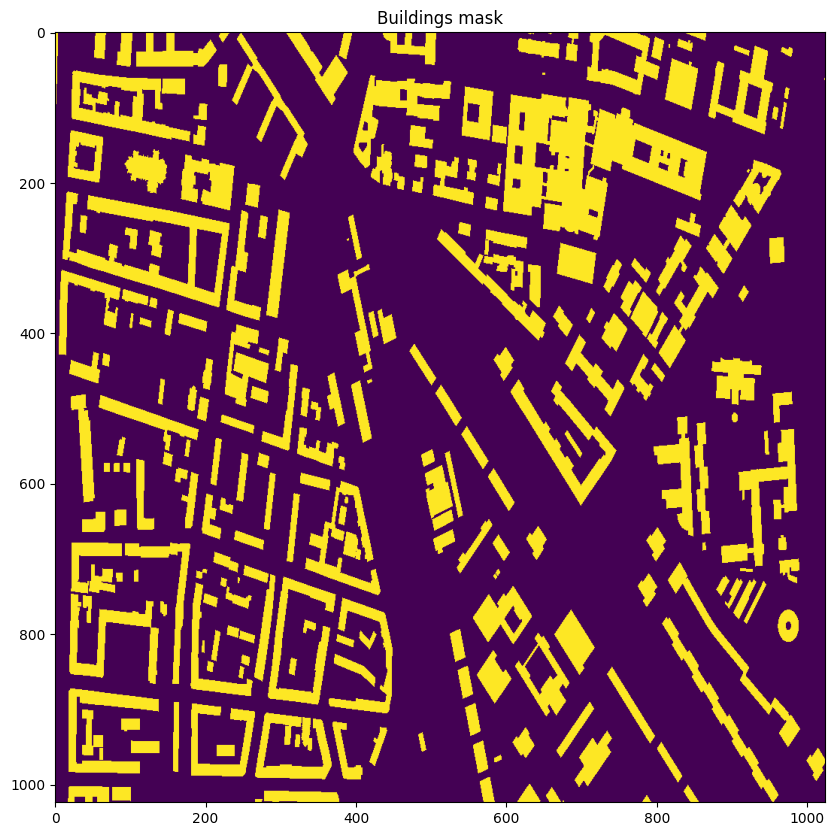

In [15]:
# Create raster
mask = geometry_mask(buildings_gdf.geometry, transform=transform, invert=True, out_shape=(1024, 1024))

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
show(mask, ax=ax)
ax.set_title("Buildings mask")
plt.show()

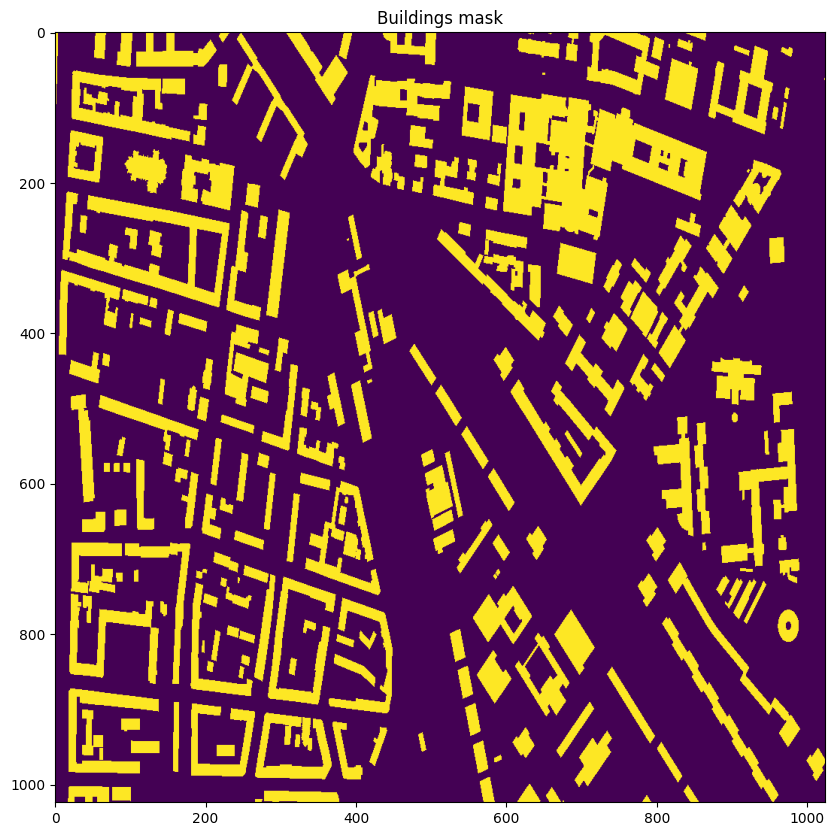

In [16]:
rasterized = rasterize(geom,
    out_shape = (1024, 1024),
    fill = 0,
    out = None,
    transform = transform,
    all_touched = False,
    default_value = 1,
    dtype = None)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
show(rasterized, ax=ax)
ax.set_title("Buildings mask")
plt.show()

### Get highest temperatures for last 5 years from DWD

DWD data: 
- an overview on all german stations is available here: https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/daily/kl/historical/KL_Tageswerte_Beschreibung_Stationen.txt
- the historic daily data for each station is available for download here: https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/daily/kl/historical/
- for a quick search, this page displays the table interactively: https://www.dwd.de/DE/leistungen/klimadatendeutschland/klimadatendeutschland.html 

In [17]:
stations=[{'name': 'Leipzig-Holzhausen', 'lat': 51.3151, 'lon': 12.4462, 'station_id': '02928'},
 {'name': 'Leipzig-Mockau', 'lat': 51.392, 'lon': 12.3962, 'station_id': '02931'},
 {'name': 'Leipzig/Halle', 'lat': 51.4347, 'lon': 12.2396, 'station_id': '02932'}]

stations_gpd = gpd.GeoDataFrame(stations, geometry=gpd.points_from_xy([station['lon'] for station in stations], [station['lat'] for station in stations]), crs="EPSG:4326")
stations_gpd.explore()

In [111]:
lz_holzhausen_kl=pd.read_csv(f"{repo_dir}/data/tageswerte_KL_02928_18631201_20231231_hist/produkt_klima_tag_18631201_20231231_02928.txt", sep=";")

#trim column names
lz_holzhausen_kl.columns = [col.strip() for col in lz_holzhausen_kl.columns]

# date to datetime64
lz_holzhausen_kl['MESS_DATUM'] = pd.to_datetime(lz_holzhausen_kl['MESS_DATUM'], format="%Y%m%d")

lz_holzhausen_kl.head()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK,eor
0,2928,1863-12-01,-999,-999.0,-999.0,1,0.1,1,-999.0,0,0.0,4.7,1009.0,-2.1,90.0,1.8,-4.8,-999.0,eor
1,2928,1863-12-02,-999,-999.0,-999.0,1,0.1,1,-999.0,0,1.7,5.5,994.1,-0.8,95.0,2.9,-4.3,-999.0,eor
2,2928,1863-12-03,-999,-999.0,-999.0,1,6.0,1,-999.0,0,6.0,7.3,985.5,4.2,89.0,5.1,-0.9,-999.0,eor
3,2928,1863-12-04,-999,-999.0,-999.0,1,4.7,1,-999.0,0,8.0,6.4,1000.0,4.0,80.0,5.3,3.3,-999.0,eor
4,2928,1863-12-05,-999,-999.0,-999.0,1,7.6,1,-999.0,0,7.7,7.2,1013.1,3.9,91.0,4.3,3.4,-999.0,eor


In [112]:
lz_holzhausen_kl.columns

Index(['STATIONS_ID', 'MESS_DATUM', 'QN_3', 'FX', 'FM', 'QN_4', 'RSK', 'RSKF',
       'SDK', 'SHK_TAG', 'NM', 'VPM', 'PM', 'TMK', 'UPM', 'TXK', 'TNK', 'TGK',
       'eor'],
      dtype='object')

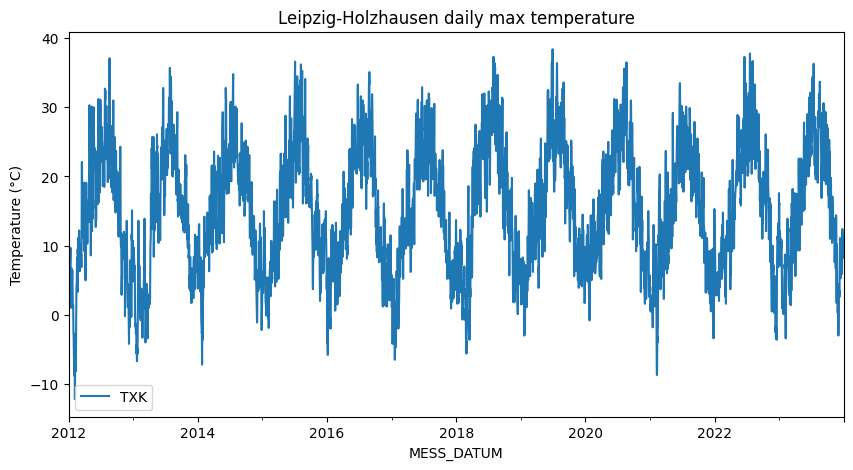

In [113]:
lz_temp_max= lz_holzhausen_kl[['MESS_DATUM','TXK']]

#np.nan for -999 in TXK
lz_temp_max['TXK'] = lz_temp_max['TXK'].replace(-999.0, np.nan)

# rolling mean
last_10_all = lz_temp_max.set_index('MESS_DATUM').loc['2012-01-01':'2023-12-31']

# Plot
fig, ax = plt.subplots(figsize=(10, 5))
last_10_all.plot(ax=ax)
ax.set_title("Leipzig-Holzhausen daily max temperature")
ax.set_ylabel("Temperature (°C)")
plt.show()

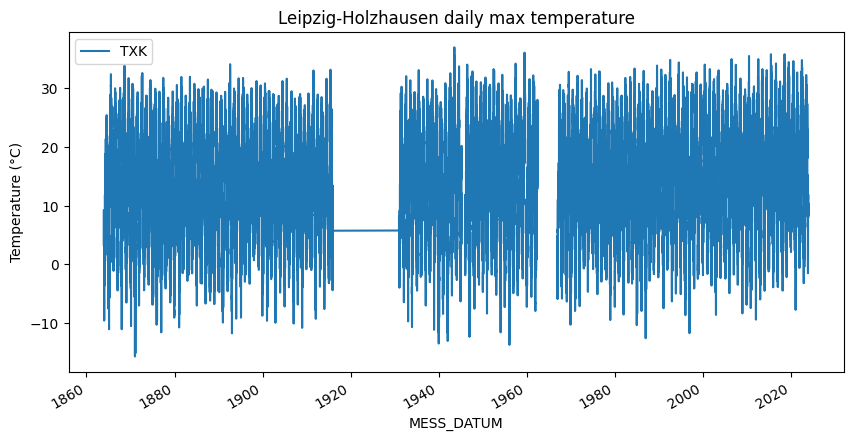

In [114]:
lz_temp_max= lz_holzhausen_kl[['MESS_DATUM','TXK']]

#np.nan for -999 in TXK
lz_temp_max['TXK'] = lz_temp_max['TXK'].replace(-999.0, np.nan)

# rolling mean
lz_temp_max_rolling = lz_temp_max.set_index('MESS_DATUM').rolling(window=3).mean()

# Plot
fig, ax = plt.subplots(figsize=(10, 5))
lz_temp_max_rolling.plot(ax=ax)
ax.set_title("Leipzig-Holzhausen daily max temperature")
ax.set_ylabel("Temperature (°C)")
plt.show()

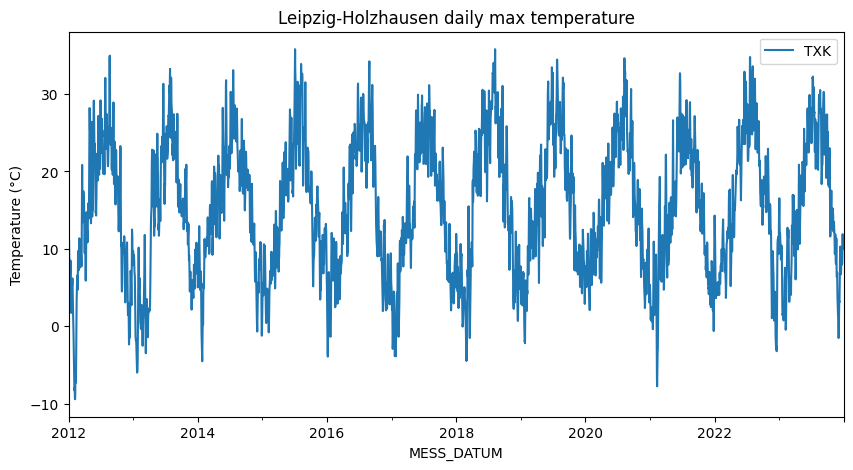

In [115]:
# get last 10 years
last_10=lz_temp_max_rolling.loc['2012-01-01':'2023-12-31']

# plot
fig, ax = plt.subplots(figsize=(10, 5))
last_10.plot(ax=ax)
ax.set_title("Leipzig-Holzhausen daily max temperature")
ax.set_ylabel("Temperature (°C)")
plt.show()

In [91]:
lz_temp_max.groupby(lz_temp_max['TXK'].gt(30).cumsum()).get_group(4).tail(3)

,MESS_DATUM,TXK
596,1865-07-19,30.8


In [116]:
lz_temp_max['gt30_roll']=lz_temp_max['TXK'].gt(30).rolling(window=3).sum()

# 3 days in a row temp > 30
lz_temp_max_gt30=lz_temp_max[lz_temp_max['gt30_roll']==3]
lz_temp_max_gt30

,MESS_DATUM,TXK,gt30_roll
598,1865-07-21,34.0,3.0
1722,1868-08-18,32.4,3.0
3162,1872-07-28,32.2,3.0
3163,1872-07-29,30.4,3.0
3202,1872-09-06,33.4,3.0
...,...,...,...
52065,2021-06-19,33.5,3.0
52066,2021-06-20,31.0,3.0
52461,2022-07-20,37.8,3.0
52462,2022-07-21,30.3,3.0


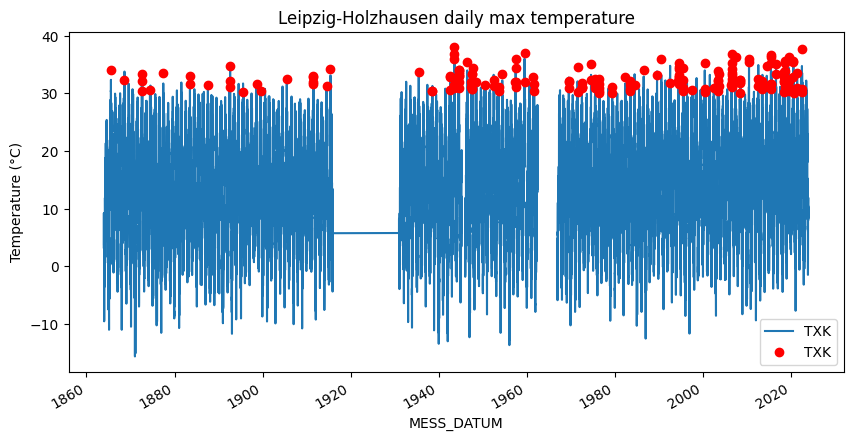

In [117]:
# plot points on rolling mean
fig, ax = plt.subplots(figsize=(10, 5))
lz_temp_max_rolling.plot(ax=ax)
lz_temp_max_gt30.plot(x='MESS_DATUM', y='TXK', style='ro', ax=ax)
ax.set_title("Leipzig-Holzhausen daily max temperature")
ax.set_ylabel("Temperature (°C)")
plt.show()

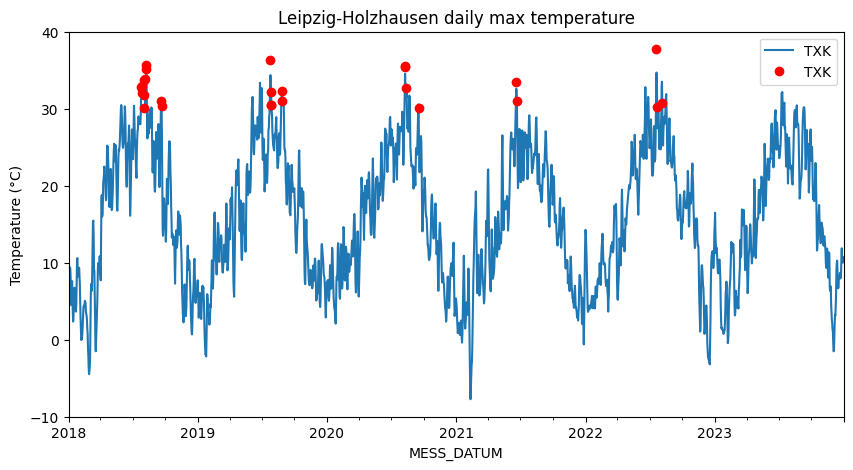

In [118]:
# last 10 years
lz_temp_max_gt30_r10=lz_temp_max_gt30[lz_temp_max_gt30['MESS_DATUM'].dt.year>=2018]
# plot points on rolling mean
fig, ax = plt.subplots(figsize=(10, 5))
lz_temp_max_rolling.loc['2018-01-01':'2023-12-31'].plot(ax=ax)
lz_temp_max_gt30_r10.plot(x='MESS_DATUM', y='TXK', style='ro', ax=ax)
ax.set_title("Leipzig-Holzhausen daily max temperature")
ax.set_ylabel("Temperature (°C)")
plt.show()

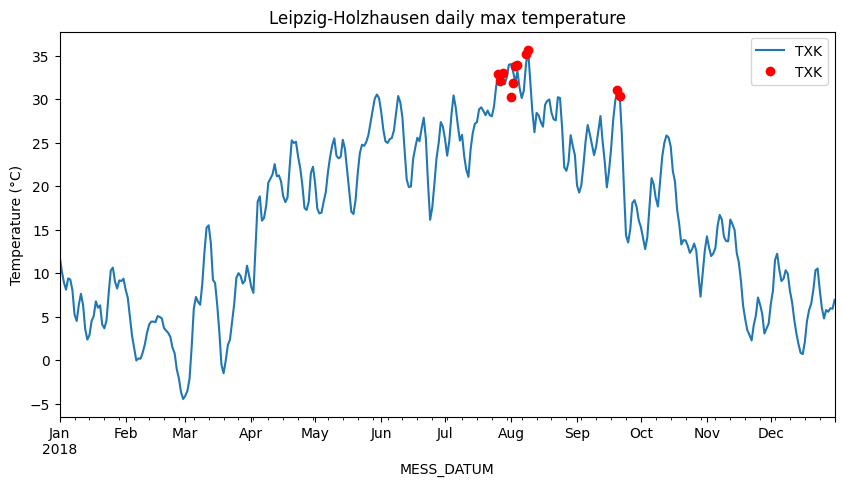

In [119]:
# rolling 3 day sum
lz_temp_max['gt30_roll']=lz_temp_max['TXK'].gt(30).rolling(window=3).sum()

# 3 days in a row temp > 30
lz_temp_max_gt30_3day=lz_temp_max[lz_temp_max['gt30_roll']==3]

def plotTemperatureYearGt30(selected_year):
    global lz_temp_max_rolling, lz_temp_max_gt30
    
    fig, ax = plt.subplots(figsize=(10, 5))
    lz_temp_max_rolling.loc[f'{selected_year}-01-01':f'{selected_year}-12-31'].plot(ax=ax)
    
    gt30_3day_points=lz_temp_max_gt30[lz_temp_max_gt30['MESS_DATUM'].dt.year==selected_year]
    if not gt30_3day_points.empty:
        gt30_3day_points.plot(x='MESS_DATUM', y='TXK', style='ro', ax=ax)
    ax.set_title("Leipzig-Holzhausen daily max temperature")
    ax.set_ylabel("Temperature (°C)")
    plt.show()
    
plotTemperatureYearGt30(2018)

In [120]:
lz_temp_max_gt30[lz_temp_max_gt30['MESS_DATUM'].dt.year==2018]

,MESS_DATUM,TXK,gt30_roll
51006,2018-07-26,32.9,3.0
51007,2018-07-27,32.1,3.0
51008,2018-07-28,33.0,3.0
51012,2018-08-01,30.2,3.0
51013,2018-08-02,31.9,3.0
51014,2018-08-03,33.8,3.0
51015,2018-08-04,33.9,3.0
51019,2018-08-08,35.2,3.0
51020,2018-08-09,35.7,3.0
51062,2018-09-20,31.1,3.0


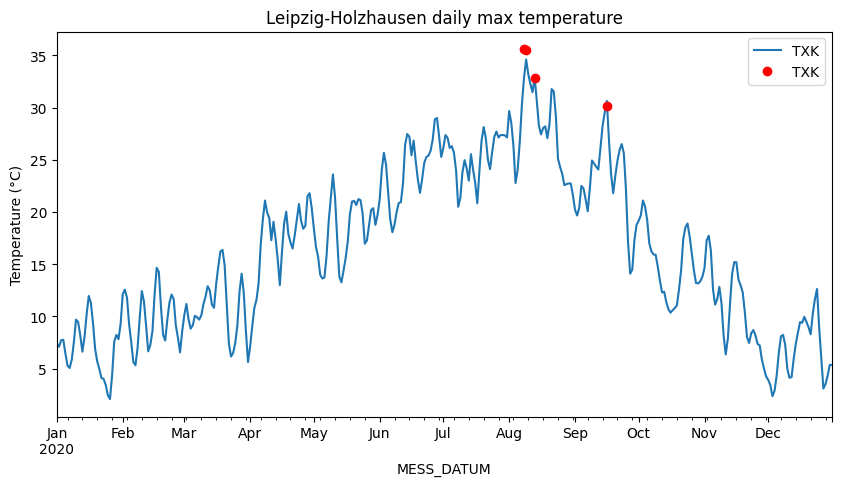

In [130]:
plotTemperatureYearGt30(2020)

### Get LST Data from Sentinel-3

collection script: https://code.usgs.gov/eros-user-services/quick-guides/querying-the-stac-api-with-geojson-objects/-/blob/main/querying_with_geojson_objects_v3.ipynb?ref_type=heads


From the node api the query options are clear:
https://github.com/stac-utils/stac-server

```bash	
curl -X "POST" "${HOST}/search" \
     -H 'Content-Type: application/json; charset=utf-8' \
     -d $'{
  "collections": [
    "sentinel-2-l2a",
    "sentinel-2-l1c"
  ],
  "bbox": [
    10,
    10,
    15,
    15
  ],
  "query": {
    "eo:cloud_cover": {
      "gte": 0,
      "lte": 5
    }
  },
  "filter": {
    "op": "<",
    "args": [
      "property": "view:sun_elevation"
    ],
    50
  }
  "sortby": {
    "field": "properties.datetime",
    "direction": "desc"
  }
}'
```

In [318]:
def fetch_stac_server(query):
    '''
    Queries the stac-server (STAC) backend.
    query is a python dictionary to pass as json to the request.
    '''
    
    search_url = f"https://landsatlook.usgs.gov/stac-server/search"
    query_return = requests.post(search_url, json=query).json()
    error = query_return.get("message", "")
    if error:
        raise Exception(f"STAC-Server failed and returned: {error}")
        
    if 'code' in query_return: # if query fails, return failure code
        print(query_return)   
    else:
        features = query_return['features']
        print(f"{len(features)} STAC items found")
        if len(features) > 0:
            print(f"first feature: {features[0]}")
            
            query_gdf = gpd.GeoDataFrame.from_features(features, crs="EPSG:4326")
            query_gdf['assets'] = [ 
                feature["assets"]
                for feature in features
            ]
            query_gdf['description'] = [feature["description"] for feature in features]
            query_gdf['stac_id']= [feature["id"] for feature in features]

            return query_gdf
        else:
            print("No features found")
            return None

In [320]:
def send_STAC_query(limit=200, collections='landsat-c2l2-sr', intersects=None, year:str="2025", month:str="12", date_list:list[str]=None):
    '''
    This function helps to create a simple parameter dictionary for querying 
    the Landsat Collection 2 Level 2 Surface Reflectance feature in the STAC Server.
    It prints the parameter dictionary and returns the query results.
    
    args:
    limit: int, default 200, number of items to return
    collections: str, default 'landsat-c2l2-sr', collection to query
    intersects: dict, default None, geometry to intersect with
    year: str, default None, year to filter by
    month: str, default None, month to filter by in format '01'
    date_list: list, default None, list of dates (YYYY-MM-DD) to filter by
    '''
    params = {}
    if limit is not None:
        params['limit'] = limit
    
    if collections is not None:
        params['collections'] = collections
        
    if intersects is not None:
        params['intersects'] = intersects
        
    #filter by date
    if date_list is not None:
        formatted_dates = [f"{date}T00:00:00Z" for date in date_list]
        params["datetime"] = ",".join(formatted_dates)

        all_results = []

        for date in date_list:
            params["datetime"] = f"{date}T00:00:00Z/{date}T23:59:59Z"
            
            print(f"Querying STAC for date: {date}")
            result = fetch_stac_server(params)

            if result is not None:
                all_results.append(result)

        if all_results:
            return gpd.pd.concat(all_results, ignore_index=True)
        else:
            return None
        
    else:
        max_day = 31
        if month is not None:
            #set max day for month
            max_day=calendar.monthrange(int(year), int(month))[1]
        
        if year is not None or month is not None:        
            params['datetime'] = f"{year if year else '1970'}-{month if month else '01'}-01T00:00:00Z/{year}-{month}-{max_day}T23:59:59Z"
        
        print(params) 
        
        return fetch_stac_server(params)

In [321]:
bbox_polygon=json.loads(bbox_gdf.to_json())['features'][0]['geometry']
query_gdf = send_STAC_query(intersects=bbox_polygon, limit=20, year='2020') #,month='06') #,date_list=['2020-01-01', '2022-10-14'])
query_gdf.head(2)

{'limit': 20, 'collections': 'landsat-c2l2-sr', 'intersects': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}, 'datetime': '2020-12-01T00:00:00Z/2020-12-31T23:59:59Z'}
2 STAC items found
first feature: {'type': 'Feature', 'stac_version': '1.0.0', 'stac_extensions': ['https://landsat.usgs.gov/stac/landsat-extension/v1.1.1/schema.json', 'https://stac-extensions.github.io/view/v1.0.0/schema.json', 'https://stac-extensions.github.io/projection/v1.0.0/schema.json', 'https://stac-extensions.github.io/file/v1.0.0/schema.json', 'https://stac-extensions.github.io/eo/v1.0.0/schema.json', 'https://stac-extensions.github.io/alternate-assets/v1.1.0/schema.json', 'https://stac-extensions.github.io/storage/v1.0.0/schema.json', 'https://stac-extensions.github.io/classification/v1.0.0/schema.json'], 'id': 'LC08_L2SP_194024_20201210_20210313_02_T2_SR', 'description': 'Landsat Collection 2 Level-2 Surface Reflectan

,geometry,datetime,eo:cloud_cover,view:sun_azimuth,view:sun_elevation,platform,instruments,view:off_nadir,landsat:cloud_cover_land,landsat:wrs_type,...,landsat:collection_number,landsat:correction,proj:epsg,proj:shape,proj:transform,created,updated,assets,description,stac_id
0,"POLYGON ((10.31655 52.76067, 9.60206 51.06198,...",2020-12-10T10:09:29.230396Z,100.00,166.155470,14.248329,LANDSAT_8,"[OLI, TIRS]",0,100.00,2,...,02,L2SP,32632,"[7881, 7781]","[30, 0, 540285, 0, -30, 5847015]",2022-07-06T21:48:39.258Z,2022-07-06T21:48:39.258Z,"{'thumbnail': {'title': 'Thumbnail image', 'ty...",Landsat Collection 2 Level-2 Surface Reflectan...,LC08_L2SP_194024_20201210_20210313_02_T2_SR
1,"POLYGON ((11.8633 52.76048, 11.14873 51.06183,...",2020-12-03T10:03:18.404907Z,97.95,166.739881,15.127626,LANDSAT_8,"[OLI, TIRS]",0,97.95,2,...,02,L2SP,32633,"[8151, 8061]","[30, 0, 228285, 0, -30, 5850915]",2022-07-06T19:02:03.410Z,2022-07-06T19:02:03.410Z,"{'thumbnail': {'title': 'Thumbnail image', 'ty...",Landsat Collection 2 Level-2 Surface Reflectan...,LC08_L2SP_193024_20201203_20210313_02_T2_SR


In [322]:
#query_gdf.boundary.explore()
query_gdf.explore(fill=0)

In [238]:
query_gdf.datetime

0     2020-12-10T10:09:29.230396Z
1     2020-12-03T10:03:18.404907Z
2     2020-11-24T10:09:27.884427Z
3     2020-11-17T10:03:15.110009Z
4     2020-11-16T09:30:56.492299Z
5     2020-11-09T09:25:14.845222Z
6     2020-11-01T10:03:16.245971Z
7     2020-10-31T09:32:02.417994Z
8     2020-10-24T09:26:19.614703Z
9     2020-10-23T10:09:28.114913Z
10    2020-10-16T10:03:17.458782Z
11    2020-10-15T09:33:05.795023Z
12    2020-10-08T09:27:22.050560Z
13    2020-10-07T10:09:27.705314Z
14    2020-09-30T10:03:15.876202Z
15    2020-09-29T09:34:07.126587Z
16    2020-09-22T09:28:22.627792Z
17    2020-09-21T10:09:24.616081Z
18    2020-09-14T10:03:11.661077Z
19    2020-09-13T09:35:09.597950Z
Name: datetime, dtype: object

query the 30 degree temperature data

In [125]:
gt30_3day_5years=lz_temp_max_gt30_3day[lz_temp_max_gt30_3day.MESS_DATUM.dt.year>=2018]
gt30_3day_5years_dates=gt30_3day_5years.MESS_DATUM.to_list()

# get dates in format YYYY-MM-DD
gt30_3day_5years_dates=[date.strftime("%Y-%m-%d") for date in gt30_3day_5years_dates]
#gt30_3day_5years_dates

In [136]:
query_gdf = send_STAC_query(intersects=bbox_polygon, limit=1, date_list=gt30_3day_5years_dates, collections='landsat-c2l2-st')
query_gdf.head(2)

Querying STAC for date: 2018-07-26
0 STAC items found
No features found
Querying STAC for date: 2018-07-27
0 STAC items found
No features found
Querying STAC for date: 2018-07-28
0 STAC items found
No features found
Querying STAC for date: 2018-08-01
0 STAC items found
No features found
Querying STAC for date: 2018-08-02
0 STAC items found
No features found
Querying STAC for date: 2018-08-03
0 STAC items found
No features found
Querying STAC for date: 2018-08-04
0 STAC items found
No features found
Querying STAC for date: 2018-08-08
1 STAC items found
first feature: {'type': 'Feature', 'stac_version': '1.0.0', 'stac_extensions': ['https://landsat.usgs.gov/stac/landsat-extension/v1.1.1/schema.json', 'https://stac-extensions.github.io/view/v1.0.0/schema.json', 'https://stac-extensions.github.io/projection/v1.0.0/schema.json', 'https://stac-extensions.github.io/eo/v1.0.0/schema.json', 'https://stac-extensions.github.io/alternate-assets/v1.1.0/schema.json', 'https://stac-extensions.github.

,geometry,datetime,eo:cloud_cover,view:sun_azimuth,view:sun_elevation,platform,instruments,view:off_nadir,landsat:cloud_cover_land,landsat:wrs_type,...,proj:epsg,proj:shape,proj:transform,card4l:specification,card4l:specification_version,created,updated,assets,description,stac_id
0,"POLYGON ((11.89839 52.76113, 11.1825 51.06267,...",2018-08-08T10:02:19.405298Z,30.12,151.463725,51.627690,LANDSAT_8,"[OLI, TIRS]",0,30.12,2,...,32633,"[8151, 8061]","[30, 0, 230685, 0, -30, 5850915]",ST,5.0,2022-06-29T05:02:13.925Z,2022-07-07T10:32:19.688Z,"{'thumbnail': {'title': 'Thumbnail image', 'ty...",Landsat Collection 2 Level-2 Surface Temperatu...,LC08_L2SP_193024_20180808_20200831_02_T1_ST
1,"POLYGON ((10.11083 52.69589, 9.45272 51.11283,...",2019-07-25T09:57:12.163744Z,0.00,144.699118,53.930067,LANDSAT_7,[ETM],0,0.00,2,...,32632,"[7311, 8241]","[30, 0, 524985, 0, -30, 5840715]",ST,5.0,2022-06-28T15:58:02.540Z,2022-06-28T15:58:02.540Z,"{'thumbnail': {'title': 'Thumbnail image', 'ty...",Landsat Collection 2 Level-2 Surface Temperatu...,LE07_L2SP_194024_20190725_20200825_02_T1_ST


save as geoparquet

In [137]:
query_gdf.to_parquet(f"{repo_dir}/data/landsat_query_gt30_2018_2022.parquet")

In [60]:
query_gdf=gpd.read_parquet(f"{repo_dir}/data/landsat_query_gt30_2018_2022.parquet")
query_gdf.explore()

Get the images for the requested collection information

For information on the asset links:
https://landsat.usgs.gov/stac/LC09_L2SP_095022_20220625_20220627_02_T1_ST_stac.json

```python
assets=requests.get('https://landsat.usgs.gov/stac/LC09_L2SP_095022_20220625_20220627_02_T1_ST_stac.json').json()['assets']
assets
```

We also stored them in the geodataframe:

In [77]:
query_gdf.iloc[0].assets

{'ANG.txt': {'alternate': {'s3': {'href': 's3://usgs-landsat/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_ANG.txt',
    'storage:platform': 'AWS',
    'storage:requester_pays': True}},
  'description': 'Collection 2 Level-2 Angle Coefficients File (ANG)',
  'file:checksum': '134073be283c780d9f779dc2bda8c7dbf612dec14c0b52dd00b7fa710cb8b515636ceb278e90e48835435391dd7ad89be11a03d094ac2415c754d594190920ae61cd',
  'href': 'https://landsatlook.usgs.gov/data/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_ANG.txt',
  'roles': array(['metadata'], dtype=object),
  'title': 'Angle Coefficients File',
  'type': 'text/plain'},
 'ATRAN': {'alternate': {'s3': {'href': 's3://usgs-landsat/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_ST_ATRAN.

To pre-process the LST data correctly, the QA bands from Landsat should be considered as well:

| QA Band | What it contains | Primary purpose |
|---------|------------------|-----------------|
| qa (ST_QA) | Basic surface temperature QA | Indicates confidence in the ST retrieval (based on conditions like cloud cover, emissivity, etc.) |
| qa_pixel (QA_PIXEL) | Full pixel quality assessment | Provides cloud, snow, water, and cirrus flags — very useful for masking out unreliable pixels. |
| qa_radsat (QA_RADSAT) | Radiometric saturation QA | Tells if specific spectral bands are saturated — typically important for reflectance bands, less so for LST. |

In [8]:
def requestLandsatTemperatureProducts(query_gdf):
    '''
    This function retrieves the Landsat 8 Surface Temperature products from the USGS server.
    It returns a list of the product urls.
    '''
    products = []
    for index, row in query_gdf.iterrows():
        assets = row.assets
        if 'lwir11' in assets and assets['lwir11'] is not None:
            products.append({"stac_id": row.stac_id, "datetime": row.datetime,
                             "thermal": {
                             "url": assets['lwir11']['href'],
                             "alternate": assets['lwir11']['alternate']},
                            "qa_pixel":{"url": assets['qa_pixel']['href'], "alternate": assets['qa_pixel']['alternate']}
                            })
                            
        elif 'lwir' in assets and assets['lwir'] is not None:
            print(f"found only B6 from Landsat 7 for {row.stac_id}")
            # products.append({"stac_id": row.stac_id, "datetime": row.datetime, 
                            #  "url": assets['lwir']['href'], "alternate": assets['lwir']['alternate']})
            
        else:
            print(f"No lwir11 asset for {row.stac_id}")

    return products

products=requestLandsatTemperatureProducts(query_gdf)
products[0]

found only B6 from Landsat 7 for LE07_L2SP_194024_20190725_20200825_02_T1_ST
found only B6 from Landsat 7 for LE07_L2SP_193024_20220720_20220903_02_T1_ST


{'stac_id': 'LC08_L2SP_193024_20180808_20200831_02_T1_ST',
 'datetime': '2018-08-08T10:02:19.405298Z',
 'thermal': {'url': 'https://landsatlook.usgs.gov/data/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_ST_B10.TIF',
  'alternate': {'s3': {'href': 's3://usgs-landsat/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_ST_B10.TIF',
    'storage:platform': 'AWS',
    'storage:requester_pays': True}}},
 'qa_pixel': {'url': 'https://landsatlook.usgs.gov/data/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_QA_PIXEL.TIF',
  'alternate': {'s3': {'href': 's3://usgs-landsat/collection02/level-2/standard/oli-tirs/2018/193/024/LC08_L2SP_193024_20180808_20200831_02_T1/LC08_L2SP_193024_20180808_20200831_02_T1_QA_PIXEL.TIF',
    'storage:platform': 

In [9]:
aws_access_key_id = os.getenv("AWS_ACCESS_KEY_ID")
aws_secret_access_key = os.getenv("AWS_SECRET_ACCESS_KEY")

# Setup boto3 client
s3 = boto3.client(
    's3',
    aws_access_key_id=aws_access_key_id,
    aws_secret_access_key=aws_secret_access_key,
    region_name='us-west-2'
)

def parse_s3_url(s3_url):
    if s3_url.startswith("s3://"):
        s3_url = s3_url[5:]
    bucket, key = s3_url.split("/", 1)
    return bucket, key

class TqdmFileWrapper:
    def __init__(self, fileobj, tqdm_bar):
        self.fileobj = fileobj
        self.tqdm_bar = tqdm_bar

    def write(self, data):
        self.fileobj.write(data)
        self.tqdm_bar.update(len(data))

    def close(self):
        self.fileobj.close()

def download_tif(s3_url, local_path):
    bucket, key = parse_s3_url(s3_url)

    # First, find out the file size
    head = s3.head_object(Bucket=bucket, Key=key, RequestPayer='requester')
    file_size = head['ContentLength']

    # Setup tqdm progress bar
    with tqdm(total=file_size, unit='B', unit_scale=True, desc=f"Downloading {os.path.basename(local_path)}") as pbar:
        with open(local_path, 'wb') as f:
            wrapped_file = TqdmFileWrapper(f, pbar)
            s3.download_fileobj(
                Bucket=bucket,
                Key=key,
                Fileobj=wrapped_file,
                ExtraArgs={'RequestPayer': 'requester'}
            )


def requestProduct(product):
    '''
    This function retrieves the product from the USGS server and saves it to the output path.
    '''
    
    output_path_base = f"{repo_dir}/data/landsat_temperature/{product['stac_id']}"
    output_path_thermal = f"{output_path_base}_thermal.tif"
    output_path_qa_pixel = f"{output_path_base}_qa_pixel.tif"
    
    if not os.path.exists(output_path_thermal):
        os.makedirs(os.path.dirname(output_path_thermal), exist_ok=True)
        s3_url = product["thermal"]['alternate']['s3']['href']
        download_tif(s3_url, output_path_thermal)

    if not os.path.exists(output_path_qa_pixel):
        os.makedirs(os.path.dirname(output_path_qa_pixel), exist_ok=True)
        s3_url = product["qa_pixel"]['alternate']['s3']['href']
        download_tif(s3_url, output_path_qa_pixel)

    return

requestProduct(products[1])

Thread download all the datasets

In [ ]:
def process_all_products(products, max_workers=8):
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        {executor.submit(requestProduct, product): product for product in products}

process_all_products(products)

Open the first file to plot and clip to bbox

In [47]:
files=os.listdir(f"{repo_dir}/data/landsat_temperature")
files=[file for file in files if file.startswith("LC08")]
files=[f"{repo_dir}/data/landsat_temperature/{file}" for file in files]

thermal_files=[file for file in files if file.endswith("thermal.tif")]
qa_pixel_files=[file for file in files if file.endswith("qa_pixel.tif")]

xds = rxr.open_rasterio(thermal_files[0])

#clip to bbox
xds = xds.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs)

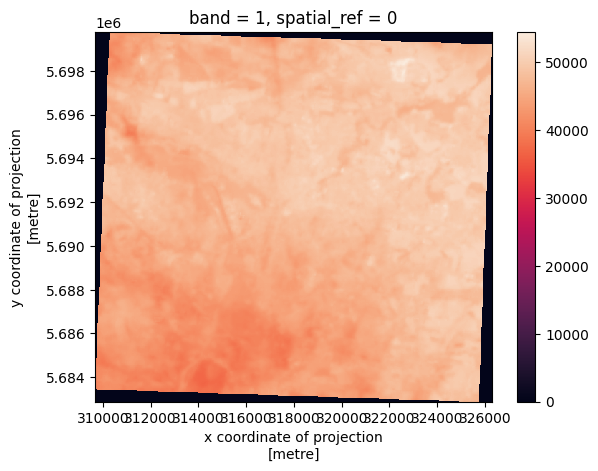

In [ ]:
xds.plot(cmap=rocket)

Assessing the quality band

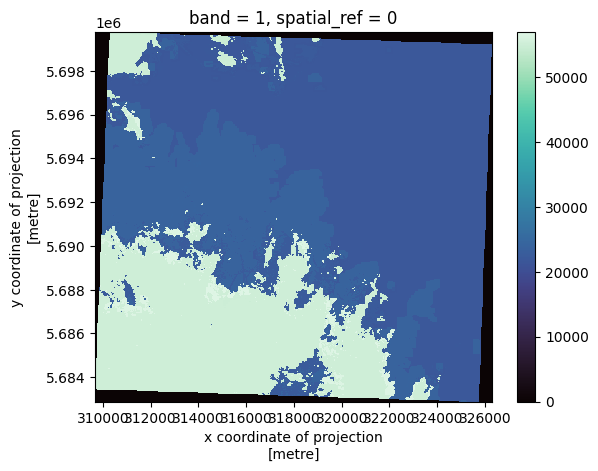

In [53]:
xds_qa = rxr.open_rasterio(qa_pixel_files[0])
xds_qa = xds_qa.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs)
xds_qa.plot(cmap=mako)

In [54]:
# Define bit positions for cloud and cloud shadow
CLOUD_SHADOW_BIT = 3  # Bit 3 = cloud shadow
CLOUD_BIT = 5         # Bit 5 = cloud

# Create masks
cloud_shadow_mask = (xds_qa & (1 << CLOUD_SHADOW_BIT)) == 0  # True = no shadow
cloud_mask = (xds_qa & (1 << CLOUD_BIT)) == 0                 # True = no cloud

clear_mask = cloud_shadow_mask & cloud_mask
xds_qa = clear_mask.astype(np.uint8)

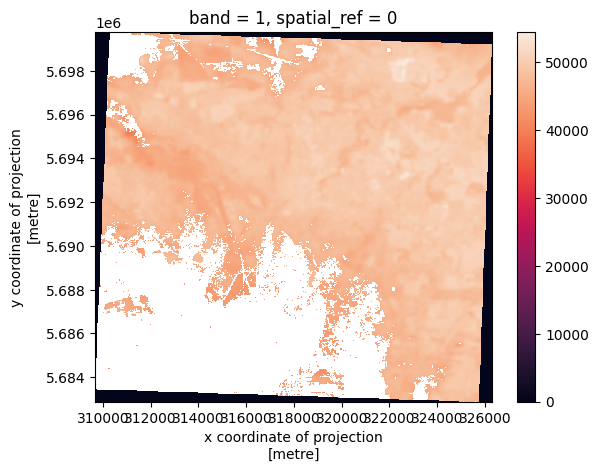

In [44]:
xds.where(xds_qa).plot(cmap=rocket)

To obtain actual temperature values, the Landsat specific scale and offset values need to be applied to the data, like indicated here: https://www.usgs.gov/faqs/how-do-i-use-a-scale-factor-landsat-level-2-science-products

A good tutorial on how to process satellite imagery: https://medium.com/@ridhomuh002/analyzing-land-surface-temperature-lst-with-landsat-8-data-in-google-earth-engine-f4dd7ca28e70

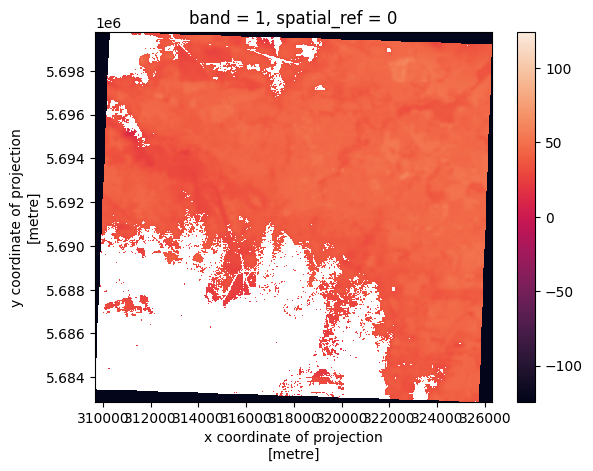

In [57]:
scale_factor=0.00341802
add_offset=149.0-273.15
xds_new=xds*scale_factor+add_offset

xds_new.where(xds_qa).plot(cmap=rocket)

Create a processed zarr for the Landsat data

In [58]:
files=os.listdir(f"{repo_dir}/data/landsat_temperature")
files=[file for file in files if file.startswith("LC08")]
file_paths=[f"{repo_dir}/data/landsat_temperature/{file}" for file in files]
file_set=[file_paths[i:i+2] for i in range(0, len(file_paths), 2)]

In [81]:
#### create landsat zarr ###

#read files
files=os.listdir(f"{repo_dir}/data/landsat_temperature")
files=[file for file in files if file.startswith("LC08")]
file_paths=[f"{repo_dir}/data/landsat_temperature/{file}" for file in files]
file_sets=[file_paths[i:i+2] for i in range(0, len(file_paths), 2)]

# find file in query_gdf
def find_file(stac_id):
    return query_gdf[query_gdf['stac_id']==stac_id].iloc[0]

# read file function with metadata attached
def readLandsatTifsToXarrayDS(ds_file_path_set):
    """
    Read Landsat tif files to xarray dataset and attach metadata.
    
    args:
    file_path: str, path to the tif file    
    """
    
    thermal_file_path=ds_file_path_set[1]
    qa_pixel_file_path=ds_file_path_set[0]
    
    if not os.path.exists(thermal_file_path):
        print(f"File not found: {thermal_file_path}")
        return None
    if not os.path.exists(qa_pixel_file_path):
        print(f"File not found: {qa_pixel_file_path}")
        return None
    
    #####create thermal data array######
    #read file
    xda=rxr.open_rasterio(thermal_file_path, masked=True)
    
    #clip to bbox
    xda = xda.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs)
    
    # apply scaling factor to degrees celsius
    scale_factor=0.00341802
    add_offset=149.0-273.15
    #xda=xda*scale_factor+add_offset
    xda.attrs['scale_factor']=scale_factor
    xda.attrs['add_offset']=add_offset
    
    #rename data array
    xda=xda.rename('surface_temp_b10')
    
    
    #####create qa pixel data array#######
    #read file
    xda_qa=rxr.open_rasterio(qa_pixel_file_path)
    
    #clip to bbox
    xda_qa = xda_qa.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs)
    
    #mask cloud and cloud shadow
    # Define bit positions for cloud and cloud shadow
    CLOUD_SHADOW_BIT = 3  # Bit 3 = cloud shadow
    CLOUD_BIT = 5         # Bit 5 = cloud

    # Create masks
    cloud_shadow_mask = (xda_qa & (1 << CLOUD_SHADOW_BIT)) == 0  # True = no shadow
    cloud_mask = (xda_qa & (1 << CLOUD_BIT)) == 0                 # True = no cloud

    clear_mask = cloud_shadow_mask & cloud_mask
    xda_qa = clear_mask.astype(np.uint8)
    
    #rename data array
    xda_qa=xda_qa.rename('qa_pixel')
    
    
    #####create masked array #####
    #create masked array
    xda_mask=xda.where(xda_qa)
    
    #rename data array
    xda_mask=xda_mask.rename('surface_temp_b10_masked')
    
    
    #####combine data arrays####
    xds=xr.merge([xda, xda_qa, xda_mask])
    
    
    #####add metadata#####
    # get stac data
    stac_id=thermal_file_path.split("/")[-1].split(".")[0].split("_thermal")[0]
    file=find_file(stac_id)
    date=file.datetime
    
    #add general metadata
    xds.attrs['title']="Landsat 8 Surface Temperature"
    xds.attrs['description']="Landsat 8 Surface Temperature data from USGS for specific hot days (3 continous >30C° days) in Leipzig"
    xds.attrs['source']="USGS"
    xds.attrs['crs']="EPSG:4326"
    xds.attrs['bbox']=bbox_gdf.to_json()
    xds.attrs['variables']={"surface_temp_b10": "Surface Temperature Band (B10)",
                            "qa_pixel": "Quality Assessment Pixel",
                            "surface_temp_b10_masked": "Surface Temperature Band (B10) Masked"}
    xds.attrs['units']={"surface_temp_b10": "°C", "qa_pixel": "1", "surface_temp_b10_masked": "°C"}
    
    #remove scale_factor and add_offset from attrs
    xds.attrs.pop('scale_factor', None)
    xds.attrs.pop('add_offset', None)
    
    #remove spatial_ref and band coords
    xds=xds.drop_vars(["spatial_ref", "band"])
    
    #squeeze band from variables
    xds=xds.squeeze("band", drop=True)
    
    # add time coordinate
    xds=xds.expand_dims(time=[date])
    # xds=xds.expand_dims(stac_id=[stac_id])
    # xds=xds.expand_dims(view_sun_elevation=[file['view:sun_elevation']])
    # xds=xds.expand_dims(view_sun_azimuth=[file['view:sun_azimuth']])
    # xds=xds.expand_dims(view_off_nadir=[file['view:off_nadir']])

    #add metadata as variables over time
    xds['stac_id']=xr.DataArray([stac_id], dims=['time'])
    xds['view_sun_elevation']=xr.DataArray([file['view:sun_elevation']], dims=['time'])
    xds['view_sun_azimuth']=xr.DataArray([file['view:sun_azimuth']], dims=['time'])
    xds['view_off_nadir']=xr.DataArray([file['view:off_nadir']], dims=['time'])

    return xds

# read all files
xds_list=[readLandsatTifsToXarrayDS(file_set) for file_set in file_sets]
#landsat_xr_ds=readLandsatTifsToXarrayDS(file_sets[0])

Weirdly one of the requested scenes does not show the region specified when running the stac request as seen in the following:

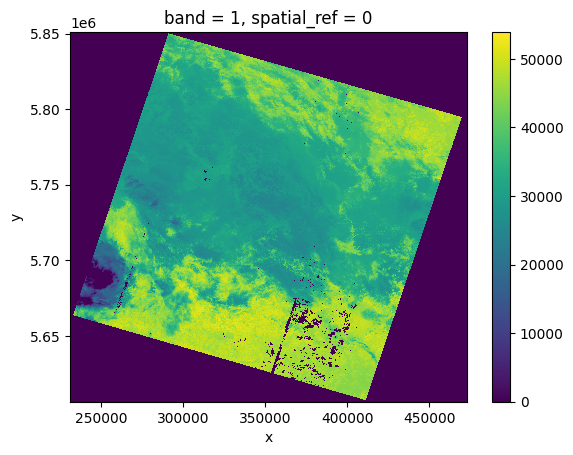

In [212]:
rxr.open_rasterio(thermal_files[3]).plot()#.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs).plot()

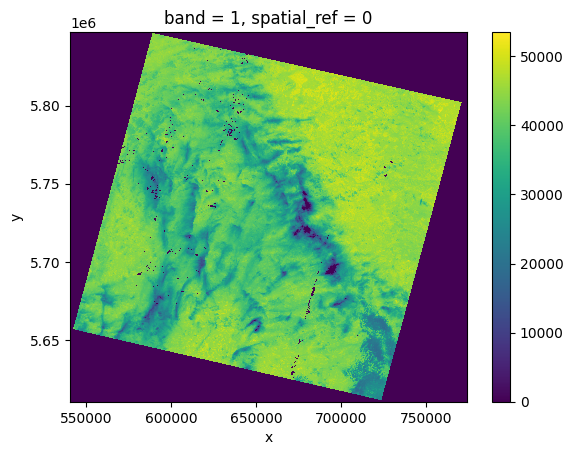

In [211]:
rxr.open_rasterio(thermal_files[4]).plot()#.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs).plot()

Therefore, the coordinates should be be reindexed to a template grid before concatenating the data:

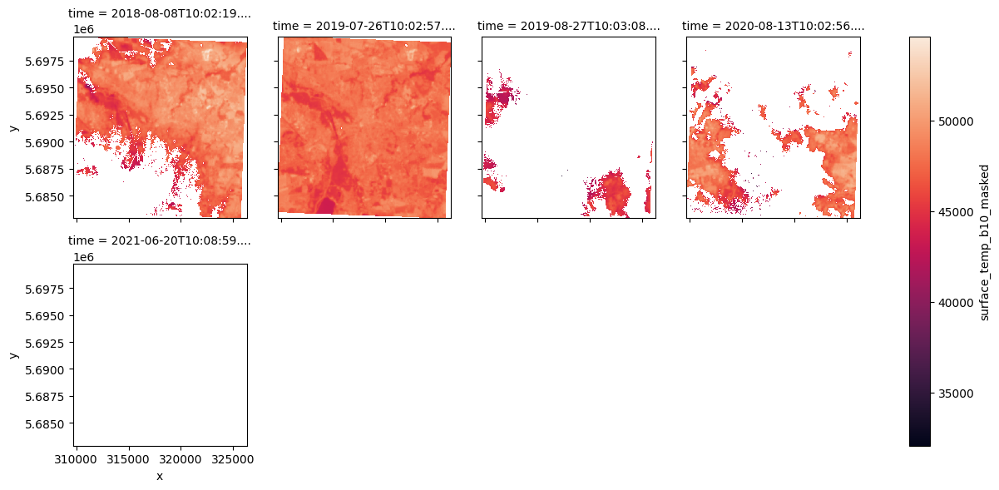

In [82]:
common_x = xds_list[0].x
common_y = xds_list[0].y

xds_list = [
    ds.reindex(x=common_x, y=common_y, method="nearest")  # or method="pad"
    for ds in xds_list
]

#combine datasets
landsat_xr_ds=xr.concat(xds_list, dim='time')
landsat_xr_ds.surface_temp_b10_masked.plot(col='time', col_wrap=4, cmap=rocket)

We stored the scale factor and offset within the variables, which is why only after saving and reading in as from zarr, the data plots with the correct scale:

In [83]:
#save as zarr dataset
landsat_xr_ds.to_zarr(f"{repo_dir}/data/landsat_temperature_gt30_2018_2022.zarr", mode='w')

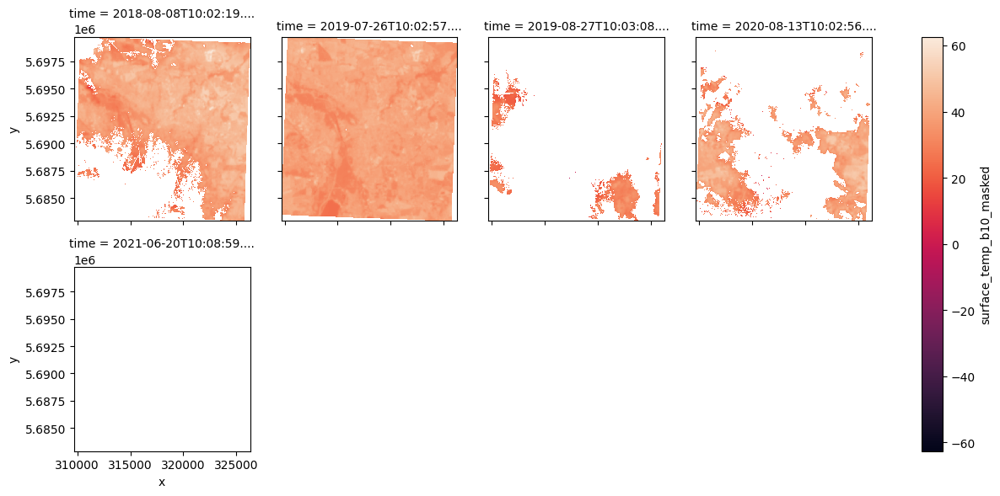

In [15]:
landsat_xr_ds=xr.open_zarr(f"{repo_dir}/data/landsat_temperature_gt30_2018_2022.zarr")
landsat_xr_ds.surface_temp_b10_masked.plot(col='time', col_wrap=4, cmap=rocket)

In [16]:
landsat_xr_ds

<xarray.Dataset> Size: 20MB
Dimensions:                  (time: 5, y: 563, x: 554)
Coordinates:
  * time                     (time) object 40B '2018-08-08T10:02:19.405298Z' ...
  * x                        (x) float64 4kB 3.097e+05 3.097e+05 ... 3.263e+05
  * y                        (y) float64 5kB 5.7e+06 5.7e+06 ... 5.683e+06
Data variables:
    stac_id                  (time) object 40B ...
    qa_pixel                 (time, y, x) uint8 2MB ...
    view_off_nadir           (time) int64 40B ...
    view_sun_elevation       (time) float64 40B ...
    view_sun_azimuth         (time) float64 40B ...
    surface_temp_b10_masked  (time, y, x) float32 6MB ...
    surface_temp_b10         (time, y, x) float64 12MB ...
Attributes:
    AREA_OR_POINT:  Point
    title:          Landsat 8 Surface Temperature
    description:    Landsat 8 Surface Temperature data from USGS for specific...
    source:         USGS
    crs:            EPSG:4326
    bbox:           {"type": "FeatureCollection", "features": [{"id": "0", "t...
    variables:      {'surface_temp_b10': 'Surface Temperature Band (B10)', 'q...
    units:          {'surface_temp_b10': '°C', 'qa_pixel': '1', 'surface_temp...

### Get Skysat high resolution images from Planet Labs

Planet lab's has a rest api for metadata based search: https://developers.planet.com/docs/apis/data/reference/#tag/Item-Search

More information on search filters etc. can be found here: https://developers.planet.com/docs/apis/data/searches-filtering/

From the results, the images then can be downloaded like indicated here:
https://developers.planet.com/docs/planetschool/downloading-imagery-with-data-api/

Set up the base:

In [7]:
base_url="https://api.planet.com/data/v1"
planet_api_key=(os.getenv("PLANET_API_KEY"), "")

Get all possible Planet Scenes:

In [286]:
request_path="/item-types" #/quick-search

url=f"{base_url}{request_path}"
response=requests.get(url, auth=planet_api_key)

scenes=response.json()
scenes_df=pd.DataFrame(scenes["item_types"])
scenes_df

,_links,display_description,display_name,id,supported_asset_types
0,{'_self': 'https://api.planet.com/data/v1/item...,8-band PlanetScope imagery that is framed as c...,PlanetScope Scene,PSScene,"[basic_analytic_4b, basic_analytic_8b, basic_a..."
1,{'_self': 'https://api.planet.com/data/v1/item...,RapidEye orthorectified 5-band imagery as 25km...,RapidEye Ortho Tile,REOrthoTile,"[analytic, analytic_sr, analytic_xml, udm, vis..."
2,{'_self': 'https://api.planet.com/data/v1/item...,RapidEye basic 5-band imagery with strip-based...,RapidEye Basic Scene,REScene,"[basic_analytic_b1, basic_analytic_b1_nitf, ba..."
3,{'_self': 'https://api.planet.com/data/v1/item...,SkySat imagery with strip-based framing,SkySat Collect,SkySatCollect,"[basic_l1a_all_frames, ortho_analytic, ortho_a..."
4,{'_self': 'https://api.planet.com/data/v1/item...,SkySat imagery that is framed as captured,SkySat Scene,SkySatScene,"[basic_analytic, basic_analytic_dn, basic_anal..."
5,{'_self': 'https://api.planet.com/data/v1/item...,SkySat video product,SkySat Video,SkySatVideo,"[video_file, video_frames, video_metadata]"
6,{'_self': 'https://api.planet.com/data/v1/item...,Tanager Hyperspectral Imagery,Tanager Scene,TanagerScene,"[basic_beta_udm, basic_radiance_hdf5, basic_sr..."
7,{'_self': 'https://api.planet.com/data/v1/item...,Tanager Methane Derived Products,Tanager Methane,TanagerMethane,"[ql_ch4_json, qc_ch4_json, ime_ch4_json, ortho..."


Further info on Skysat Scene and Collection:
- https://developers.planet.com/docs/data/skysatcollect/
- https://developers.planet.com/docs/data/skysatscene/

Requesting Skysat:

In [106]:
request_path="/quick-search"
url=f"{base_url}{request_path}"

item_types=["SkySatScene", "SkySatCollect"]

coordinates=json.loads(bbox_gdf.geometry.to_json())["features"][0]["geometry"]["coordinates"]

def requestPlanetItemInfo(item_types:list=["SkySatScene"], date:str=None, cloud_cover_limit:float=None, download:bool=False, further_filters:dict=None):
   
   # Define filters
   filters=[
            {
               "type":"GeometryFilter",
               "field_name":"geometry",
               "config":{
                  "type":"Polygon",
                  "coordinates": coordinates,
               }
            },
            # {
            #    "type":"AssetFilter",
            #    "config":[
            #       "ortho_analytic_8b"
            #    ]
         ]
   
   if cloud_cover_limit is not None:
      cloud_cover_filter={
         "type":"RangeFilter",
         "config":{
            "gte":0,
            "lte":cloud_cover_limit #0.6
         },
         "field_name":"cloud_cover"
      }
      filters.append(cloud_cover_filter)
      
   if download:
      download_filter={
         "type":"PermissionFilter",
         "config":[
            "assets:download"
         ]
      }
      filters.append(download_filter)
      
   if further_filters is not None:
      filters.append(further_filters)

   if date is not None:
      year=date.split("-")[0]
      month=int(date.split("-")[1])
      
            
      # define a date range of plus and minus 1 month
      start_month=str(month-1 if month != 1 else 12).zfill(2)
      end_month=str(month+1 if month !=12 else 1).zfill(2)
      end_day=calendar.monthrange(int(year), int(end_month))[1]
      
      start_year=year if month != 1 else str(int(year)-1)
      end_year=year if month != 12 else str(int(year)+1)

      start=f"{start_year}-{start_month}-01"
      end=f"{end_year}-{end_month}-{end_day}"
      
      date_range_filter={
         "type":"DateRangeFilter",
         "field_name":"acquired",
         "config":{
            "gte":f"{start}T00:00:00Z",
            "lte":f"{end}T00:00:00Z"
         }
      }
      
      filters.append(date_range_filter)


   payload = {
        "item_types": item_types,
        "filter": {
            "type": "AndFilter",
            "config": filters
        }
    }
   
   print(f"Requesting Planet items for date: {date}", payload)

   # Send POST request
   response=requests.post(url, auth=planet_api_key, json=payload)
   response=response.json()
   if "features" not in response:
      #print(response)
      return None
   else:
      #print(response)
      features_df=pd.DataFrame(response["features"])
      
      return features_df


# Get time values from xarray dataset
time_ranges = landsat_xr_ds.time
time_ranges = [pd.to_datetime(timestamp).strftime("%Y-%m-%d") for timestamp in time_ranges.values]
time_ranges

#request first time range
skysat_bydate=requestPlanetItemInfo(item_types=item_types, date=time_ranges[3])
skysat_bydate.head(2)

Requesting Planet items for date: 2020-08-13 {'item_types': ['SkySatScene', 'SkySatCollect'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2020-07-01T00:00:00Z', 'lte': '2020-09-30T00:00:00Z'}}]}}


,_links,_permissions,assets,geometry,id,properties,type
0,{'_self': 'https://api.planet.com/data/v1/item...,[],"[basic_l1a_all_frames, ortho_analytic, ortho_a...","{'coordinates': [[[12.193142777198076, 51.2220...",20200927_123020_ssc16_u0002,"{'acquired': '2020-09-27T12:30:20.187Z', 'clea...",Feature
1,{'_self': 'https://api.planet.com/data/v1/item...,[],"[basic_analytic, basic_analytic_dn, basic_anal...","{'coordinates': [[[12.292500316175602, 51.2820...",20200927_123020_ssc16d3_0034,"{'acquired': '2020-09-27T12:30:20.187Z', 'came...",Feature


Get and merge for all LST dates

In [29]:
# thread collect for all time ranges
with ThreadPoolExecutor(max_workers=8) as executor:
    skysat_bydate_list = list(tqdm(executor.map(lambda date: requestPlanetItemInfo(item_types=item_types, date=date), time_ranges), total=len(time_ranges)))
    
#merge all dataframes
skysat_bydate_df=pd.concat(skysat_bydate_list, ignore_index=True)
skysat_bydate_df.head(2)

Requesting Planet items for date: 2018-08-08Requesting Planet items for date: 2019-07-26 {'item_types': ['SkySatScene', 'SkySatCollect'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2019-06-01T00:00:00Z', 'lte': '2019-08-31T00:00:00Z'}}]}}
 {'item_types': ['SkySatScene', 'SkySatCollect'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2018-07-01T00:00:00Z', 'lte': '2018-09-30T00:00:00Z'}}]}}
Requesting Planet items for date: 2019-08-27 {'item_type

100%|██████████| 5/5 [00:02<00:00,  1.77it/s]


,_links,_permissions,assets,geometry,id,properties,type
0,{'_self': 'https://api.planet.com/data/v1/item...,[],"[basic_l1a_all_frames, ortho_analytic, ortho_a...","{'coordinates': [[[12.193142777198076, 51.2220...",20200927_123020_ssc16_u0002,"{'acquired': '2020-09-27T12:30:20.187Z', 'clea...",Feature
1,{'_self': 'https://api.planet.com/data/v1/item...,[],"[basic_analytic, basic_analytic_dn, basic_anal...","{'coordinates': [[[12.292500316175602, 51.2820...",20200927_123020_ssc16d3_0034,"{'acquired': '2020-09-27T12:30:20.187Z', 'came...",Feature


Plot as a GeoDataFrame

In [30]:
skysat_bydate_gdf=gpd.GeoDataFrame(skysat_bydate_df, geometry=[shape(geom) for geom in skysat_bydate_df["geometry"]], crs="EPSG:4326")
skysat_bydate_gdf.explore()

For all skysat scenes (this is only the first page of results):

In [ ]:
# all_skysat=requestPlanetItemInfo(item_types=item_types)
# all_skysat_gdf=gpd.GeoDataFrame(all_skysat, geometry=[shape(geom) for geom in all_skysat["geometry"]], crs="EPSG:4326")
# all_skysat_gdf.explore(fill=0)

For rapid eye for each date

In [33]:
#rapideye items
item_types=["REOrthoTile", "RESCENE"]

#thread collect for all time ranges
with ThreadPoolExecutor(max_workers=8) as executor:
    rapideye_bydate_list = list(tqdm(executor.map(lambda date: requestPlanetItemInfo(item_types=item_types, date=date), time_ranges), total=len(time_ranges)))
    
#merge all dataframes
rapideye_bydate_list=[df for df in rapideye_bydate_list if df is not None]
if not rapideye_bydate_list:
    print("No RapidEye items found")
else:
    rapideye_bydate_df=pd.concat(rapideye_bydate_list, ignore_index=True)
    rapideye_bydate_df.head(2)

Requesting Planet items for date: 2018-08-08 {'item_types': ['REOrthoTile', 'RESCENE'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2018-07-01T00:00:00Z', 'lte': '2018-09-30T00:00:00Z'}}]}}
Requesting Planet items for date: 2019-07-26 {'item_types': ['REOrthoTile', 'RESCENE'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2019-06-01T00:00:00Z', 'lte': '2019-08-31T00:00:00Z'}}]}}
Requesting Planet items for date: 2019-08-27 {'item_types': ['REOrth

  0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 5/5 [00:00<00:00, 10.71it/s]

No RapidEye items found


For planetscope for each date:

In [226]:
# planet scope ("PSScene")
item_types=["PSScene"]
cloud_cover_limit=0.1 #max 10% cloud cover

#thread collect for all time ranges
with ThreadPoolExecutor(max_workers=8) as executor:
    planet_bydate_list = list(tqdm(executor.map(lambda date: requestPlanetItemInfo(item_types=item_types, date=date, cloud_cover_limit=cloud_cover_limit), time_ranges), total=len(time_ranges)))
    
#merge all dataframes
planet_bydate_list=[df for df in planet_bydate_list if df is not None]
if not planet_bydate_list:
    print("No PlanetScope items found")
else:
    planet_bydate_df=pd.concat(planet_bydate_list, ignore_index=True)
    planet_bydate_df.head(2)

Requesting Planet items for date: 2018-08-08 {'item_types': ['PSScene'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'RangeFilter', 'config': {'gte': 0, 'lte': 0.1}, 'field_name': 'cloud_cover'}, {'type': 'DateRangeFilter', 'field_name': 'acquired', 'config': {'gte': '2018-07-01T00:00:00Z', 'lte': '2018-09-30T00:00:00Z'}}]}}
Requesting Planet items for date: 2019-07-26 {'item_types': ['PSScene'], 'filter': {'type': 'AndFilter', 'config': [{'type': 'GeometryFilter', 'field_name': 'geometry', 'config': {'type': 'Polygon', 'coordinates': [[[12.5019, 51.2705], [12.5019, 51.4174], [12.2714, 51.4174], [12.2714, 51.2705], [12.5019, 51.2705]]]}}, {'type': 'RangeFilter', 'config': {'gte': 0, 'lte': 0.1}, 'field_name': 'cloud_cover'}, {'type': 'DateRangeFilter', 'field_name': 'acquired',

100%|██████████| 5/5 [00:02<00:00,  2.44it/s]


In [ ]:
planet_bydate_gdf=gpd.GeoDataFrame(planet_bydate_df, geometry=[shape(geom) for geom in planet_bydate_df["geometry"]], crs="EPSG:4326")
planet_bydate_gdf.explore()

Save scene metadata as geoparquet

In [228]:
#save as geoparquet
planet_bydate_gdf.to_parquet(f"{repo_dir}/data/planet_gt30_2018_2022_meta.parquet")

In [229]:
planet_bydate_gdf=gpd.read_parquet(f"{repo_dir}/data/planet_gt30_2018_2022_meta.parquet")
planet_bydate_gdf.explore()

#### Check planetscope for the best available landsat scene

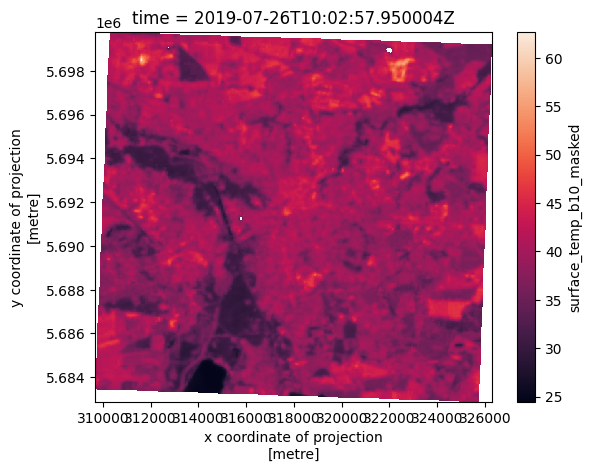

In [ ]:
time_id=1
landsat_xr_ds.surface_temp_b10_masked.isel(time=time_id).plot(cmap=rocket)

In [230]:
# Get time values from xarray dataset
time_stamp = landsat_xr_ds.isel(time=time_id).time.values
time_stamp = pd.to_datetime(time_stamp).strftime("%Y-%m-%d")
time_stamp_flat=time_stamp.replace("-", "")
time_stamp_flat_month=time_stamp.replace("-", "")[:-2]
print(time_stamp, time_stamp_flat, time_stamp_flat_month)

# filter planet_bydate_gdf by id of time_stamp_flat
planet_bydate_gdf_filtered=planet_bydate_gdf[planet_bydate_gdf['id'].str.contains(time_stamp_flat_month)]

#create date id
planet_bydate_gdf_filtered['date_id']=planet_bydate_gdf_filtered['id'].str[0:8]

display(planet_bydate_gdf_filtered.head(3))

unique_dates=planet_bydate_gdf_filtered['date_id'].unique()
print("Unique date ids:", unique_dates)

def createUniqueDateMap(df):
    random.seed(42)
    map = df.explore(
        color='white',
        name=f'All features',
        show=False
    )

    for date in unique_dates:
        # define random color
        random_color = "#" + ''.join([random.choice('0123456789ABCDEF') for j in range(6)])

        df[df['date_id'] == date].explore(
            color=random_color,
            m=map,
            name=f'Scene {date}'
        )


    # Add layer control
    folium.LayerControl().add_to(map)
    
    return map

map=createUniqueDateMap(planet_bydate_gdf_filtered)
map


2019-07-26 20190726 201907


,_links,_permissions,assets,geometry,id,properties,type,date_id
198,{'_self': 'https://api.planet.com/data/v1/item...,"[assets.basic_analytic_4b:download, assets.bas...","[basic_analytic_4b, basic_analytic_4b_rpc, bas...","POLYGON ((12.29364 51.52493, 12.35456 51.37007...",20190714_094714_04_106d,"{'acquired': '2019-07-14T09:47:14.045701Z', 'a...",Feature,20190714
199,{'_self': 'https://api.planet.com/data/v1/item...,"[assets.basic_analytic_4b:download, assets.bas...","[basic_analytic_4b, basic_analytic_4b_rpc, bas...","POLYGON ((12.39405 51.26561, 12.45429 51.11073...",20190714_094709_88_106d,"{'acquired': '2019-07-14T09:47:09.881282Z', 'a...",Feature,20190714
200,{'_self': 'https://api.planet.com/data/v1/item...,"[assets.basic_analytic_4b:download, assets.bas...","[basic_analytic_4b, basic_analytic_4b_rpc, bas...","POLYGON ((12.34343 51.395, 12.40401 51.24013, ...",20190714_094711_96_106d,"{'acquired': '2019-07-14T09:47:11.963754Z', 'a...",Feature,20190714


Unique date ids: ['20190714' '20190704' '20190727' '20190726' '20190725' '20190724'
 '20190723' '20190720' '20190710' '20190706' '20190703']


Clip scenes to bbox

In [231]:
# clip to bbox
planet_bydate_gdf_filtered_clipped = planet_bydate_gdf_filtered.clip(bbox_gdf)
map=createUniqueDateMap(planet_bydate_gdf_filtered_clipped)
map

Request for a complete cover for the best available landsat scene

In [232]:
#get the nearest ids for time_stamp_flat
planet_bydate_gdf_filtered_clipped['date_id_dt'] = pd.to_datetime(planet_bydate_gdf_filtered_clipped['date_id'])
planet_bydate_gdf_filtered_clipped['time_stamp_dt'] = pd.to_datetime(time_stamp)
planet_bydate_gdf_filtered_clipped['time_diff'] = (planet_bydate_gdf_filtered_clipped['date_id_dt'] - planet_bydate_gdf_filtered_clipped['time_stamp_dt']).dt.days
planet_bydate_gdf_filtered_clipped['time_diff'] = planet_bydate_gdf_filtered_clipped['time_diff'].abs()

#sort the dataframe by diff
planet_bydate_gdf_filtered_clipped.sort_values('time_diff', inplace=True)

def mergeNearestRows(df, bbox_gdf, max_distance=0.01):
    '''
    Merges nearest rows of a GeoDataFrame until the merged geometry fully covers a reference bbox_gdf.
    
    Parameters
    ----------
    df : GeoDataFrame
        Input tiles or geometries, sorted by some priority (e.g., temporal closeness)
    bbox_gdf : GeoDataFrame
        Contains the target bounding box (1 row with 1 Polygon/Multipolygon)
    max_distance : float
        Maximum allowed distance for adding new geometries (same units as CRS)

    Returns
    -------
    merged_gdf : GeoDataFrame
        Merged rows that together cover the full bbox_gdf
    '''
    merged_gdf = gpd.GeoDataFrame()
    bbox_geom = bbox_gdf.unary_union  # the target coverage geometry (the full bbox)

    while not df.empty:
        row = df.iloc[0]
        df = df.iloc[1:]
        merged_gdf = pd.concat([merged_gdf, gpd.GeoDataFrame([row], crs=df.crs)], ignore_index=True)

        # Update the merged geometry
        merged_geom = merged_gdf.unary_union

        if merged_geom.covers(bbox_geom):
            # Success: fully covered the bbox
            break

        # Find the nearest geometry to the current merged geometry
        distances = df.distance(merged_geom)
        nearest_idx = distances.idxmin()

        if distances[nearest_idx] < max_distance:
            nearest_row = df.loc[[nearest_idx]]
            df = df.drop(nearest_idx)
            merged_gdf = pd.concat([merged_gdf, nearest_row], ignore_index=True)
        else:
            # If no nearby geometry is available, stop (optional - could also continue and allow gaps)
            break

    # Final check
    if not merged_gdf.unary_union.covers(bbox_geom):
        raise ValueError("Failed to fully cover the target bbox with available geometries.")

    return merged_gdf

merge_df=mergeNearestRows(planet_bydate_gdf_filtered_clipped, bbox_gdf)
map=createUniqueDateMap(merge_df)
map

Create a function to process for all timestamps

In [233]:
time_ids=[(i,pd.to_datetime(v).strftime("%Y-%m-%d")) for i,v in enumerate(landsat_xr_ds.time.values)]

def createUniqueDateMap(df):
    random.seed(42)
    map = df.explore(
        color='white',
        name=f'All features',
        show=False
    )
    
    unique_dates=df['date_id'].unique()

    for date in unique_dates:
        # define random color
        random_color = "#" + ''.join([random.choice('0123456789ABCDEF') for j in range(6)])

        df[df['date_id'] == date].explore(
            color=random_color,
            m=map,
            name=f'Scene {date}'
        )


    # Add layer control
    folium.LayerControl().add_to(map)
    
    return map



def mergeNearestRows(df, bbox_gdf, max_distance=0.01):
    '''
    Merges nearest rows of a GeoDataFrame until the merged geometry fully covers a reference bbox_gdf.
    
    Parameters
    ----------
    df : GeoDataFrame
        Input tiles or geometries, sorted by some priority (e.g., temporal closeness)
    bbox_gdf : GeoDataFrame
        Contains the target bounding box (1 row with 1 Polygon/Multipolygon)
    max_distance : float
        Maximum allowed distance for adding new geometries (same units as CRS)

    Returns
    -------
    merged_gdf : GeoDataFrame
        Merged rows that together cover the full bbox_gdf
    '''
    merged_gdf = gpd.GeoDataFrame()
    bbox_geom = bbox_gdf.unary_union  # the target coverage geometry (the full bbox)

    while not df.empty:
        row = df.iloc[0]
        df = df.iloc[1:]
        merged_gdf = pd.concat([merged_gdf, gpd.GeoDataFrame([row], crs=df.crs)], ignore_index=True)

        # Update the merged geometry
        merged_geom = merged_gdf.unary_union

        if merged_geom.covers(bbox_geom):
            # Success: fully covered the bbox
            break

        # Find the nearest geometry to the current merged geometry
        distances = df.distance(merged_geom)
        nearest_idx = distances.idxmin()

        if distances[nearest_idx] < max_distance:
            nearest_row = df.loc[[nearest_idx]]
            df = df.drop(nearest_idx)
            merged_gdf = pd.concat([merged_gdf, nearest_row], ignore_index=True)
        else:
            # If no nearby geometry is available, stop (optional - could also continue and allow gaps)
            break

    # Final check
    if not merged_gdf.unary_union.covers(bbox_geom):
        raise ValueError("Failed to fully cover the target bbox with available geometries.")

    return merged_gdf


def getPlanetscopeScenesCoverForDate(time_id):
    global landsat_xr_ds, planet_bydate_gdf, bbox_gdf
    
    # Get time values from xarray dataset
    time_stamp = landsat_xr_ds.isel(time=time_id).time.values
    time_stamp = pd.to_datetime(time_stamp).strftime("%Y-%m-%d")
    #time_stamp_flat=time_stamp.replace("-", "")
    time_stamp_flat_month=time_stamp.replace("-", "")[:-2]
    month=int(time_stamp_flat_month[-2:])
    previous_month=str(month-1 if month != 1 else 12).zfill(2)
    previous_month_year=time_stamp_flat_month[:-2] if month != 1 else str(int(time_stamp_flat_month[:-2])-1)
    previous_month_time_stamp_flat=f"{previous_month_year}{previous_month}"
    next_month=str(month+1 if month !=12 else 1).zfill(2)
    next_month_year=time_stamp_flat_month[:-2] if month != 12 else str(int(time_stamp_flat_month[:-2])+1)
    next_month_time_stamp_flat=f"{next_month_year}{next_month}"
    #print(time_stamp, time_stamp_flat_month, previous_month_time_stamp_flat, next_month_time_stamp_flat)

    # filter planet_bydate_gdf by id of time_stamp_flat_month, previous_month_time_stamp_flat, next_month_time_stamp_flat
    planet_bydate_gdf_filtered=planet_bydate_gdf[planet_bydate_gdf['id'].str.contains(time_stamp_flat_month) | planet_bydate_gdf['id'].str.contains(previous_month_time_stamp_flat) | planet_bydate_gdf['id'].str.contains(next_month_time_stamp_flat)]

    #create date id
    planet_bydate_gdf_filtered['date_id']=planet_bydate_gdf_filtered['id'].str[0:8]
    
    planet_bydate_gdf_filtered_clipped = planet_bydate_gdf_filtered.clip(bbox_gdf)
    
    #get the nearest ids for time_stamp_flat
    planet_bydate_gdf_filtered_clipped['date_id_dt'] = pd.to_datetime(planet_bydate_gdf_filtered_clipped['date_id'])
    planet_bydate_gdf_filtered_clipped['time_stamp_dt'] = pd.to_datetime(time_stamp)
    planet_bydate_gdf_filtered_clipped['time_diff'] = (planet_bydate_gdf_filtered_clipped['date_id_dt'] - planet_bydate_gdf_filtered_clipped['time_stamp_dt']).dt.days
    planet_bydate_gdf_filtered_clipped['time_diff'] = planet_bydate_gdf_filtered_clipped['time_diff'].abs()

    #sort the dataframe by diff
    planet_bydate_gdf_filtered_clipped.sort_values('time_diff', inplace=True)
    
    #show df for debugging
    #display(planet_bydate_gdf_filtered_clipped)
    
    planet_scenes_cover_df=mergeNearestRows(planet_bydate_gdf_filtered_clipped, bbox_gdf)
    
    return planet_scenes_cover_df


planet_scenes_cover_df=getPlanetscopeScenesCoverForDate(time_ids[0][0])
map=createUniqueDateMap(planet_scenes_cover_df)
map

Run for all timestamps

In [234]:
planet_scope_cover_df_list=[(date_value,getPlanetscopeScenesCoverForDate(date_id)) for date_id, date_value in time_ids]

Save fully covered scenes as geoparquet

In [235]:
for i, df in planet_scope_cover_df_list:
    filename=f"{repo_dir}/data/planet_scope_cover_{i.replace('-','')}.parquet"
    df.to_parquet(filename)
    print(f"Saved: {filename}")

Saved: C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/planet_scope_cover_20180808.parquet
Saved: C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/planet_scope_cover_20190726.parquet
Saved: C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/planet_scope_cover_20190827.parquet
Saved: C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/planet_scope_cover_20200813.parquet
Saved: C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/planet_scope_cover_20210620.parquet


In [236]:
cover_df_example=gpd.read_parquet(f"{repo_dir}/data/planet_scope_cover_20200813.parquet")
map=createUniqueDateMap(cover_df_example)
map

#### Request download for all scenes

Get the cover parquet files

In [4]:
#get all parquet files that start with planet_scope_cover
files=os.listdir(f"{repo_dir}/data")
files=[file for file in files if file.startswith("planet_scope_cover") and file.endswith(".parquet")]
files=[f"{repo_dir}/data/{file}" for file in files]

planet_api_key=(os.getenv("PLANET_API_KEY"), "")

Show the properties of a single file

In [4]:
gpd.read_parquet(files[0]).head(2).properties.iloc[0]

{'acquired': '2018-08-08T09:39:23.713813Z',
 'anomalous_pixels': 0.0,
 'clear_confidence_percent': 82.0,
 'clear_percent': 89.0,
 'cloud_cover': 0.0,
 'cloud_percent': 0.0,
 'ground_control': True,
 'gsd': 3.9,
 'heavy_haze_percent': 0.0,
 'instrument': 'PS2',
 'item_type': 'PSScene',
 'light_haze_percent': 10.0,
 'pixel_resolution': 3,
 'provider': 'planetscope',
 'published': '2021-02-26T14:02:23Z',
 'publishing_stage': 'finalized',
 'quality_category': 'standard',
 'satellite_azimuth': 105.7,
 'satellite_id': '103d',
 'shadow_percent': 0.0,
 'snow_ice_percent': 0.0,
 'strip_id': '1616231',
 'sun_azimuth': 142.7,
 'sun_elevation': 50.0,
 'updated': '2024-09-27T17:01:02Z',
 'view_angle': 2.4,
 'visible_confidence_percent': 63.0,
 'visible_percent': 100.0}

Get the thumbnail for a single file to test

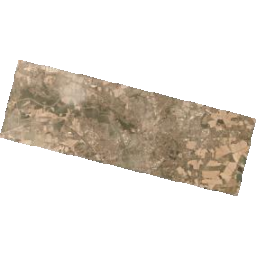

In [5]:
item=gpd.read_parquet(files[0]).iloc[0]
response=requests.get(item._links['thumbnail'], auth=planet_api_key)
img = Image.open(BytesIO(response.content))
img

Get all assets for the file

In [10]:
response=requests.get(item._links['assets'], auth=planet_api_key)
assets=response.json()
assets=pd.DataFrame(assets).T
display(assets.head())
assets.index

,_links,_permissions,md5_digest,status,type,expires_at,location
basic_analytic_4b,{'_self': 'https://api.planet.com/data/v1/asse...,[download],None,inactive,basic_analytic_4b,NaN,NaN
basic_analytic_4b_rpc,{'_self': 'https://api.planet.com/data/v1/asse...,[download],None,inactive,basic_analytic_4b_rpc,NaN,NaN
basic_analytic_4b_xml,{'_self': 'https://api.planet.com/data/v1/asse...,[download],None,inactive,basic_analytic_4b_xml,NaN,NaN
basic_udm2,{'_self': 'https://api.planet.com/data/v1/asse...,[download],None,inactive,basic_udm2,NaN,NaN
ortho_analytic_3b,{'_self': 'https://api.planet.com/data/v1/asse...,[download],None,inactive,ortho_analytic_3b,NaN,NaN


Index(['basic_analytic_4b', 'basic_analytic_4b_rpc', 'basic_analytic_4b_xml',
       'basic_udm2', 'ortho_analytic_3b', 'ortho_analytic_3b_xml',
       'ortho_analytic_4b', 'ortho_analytic_4b_sr', 'ortho_analytic_4b_xml',
       'ortho_udm2', 'ortho_visual'],
      dtype='object')

#### Submit clip order

In [11]:
collection=gpd.read_parquet(files[0])
date=collection.date_id.iloc[0]
collection_ids=collection.id.to_list()
collection_ids

['20180808_093923_103d', '20180808_093924_103d', '20180808_093922_103d']

In [ ]:
coordinates=json.loads(bbox_gdf.geometry.to_json())["features"][0]["geometry"]["coordinates"]

orders_base_url="https://api.planet.com/compute/ops/orders/v2"

def orderPlanetItem(date:str, ids:list, product:str='analytic_sr_udm2', clip_aoi:dict=None):
    """
    Request Planet item by ids and product.
    
    args:
    date: str, flat date like "20200813"
    ids: list of ids like ["20201129_150531_19_1065"]
    product: str, product name like "analytic_sr_udm2" for "ortho_analytic_4b_sr"
    clip_aoi: dict, clip area of interest as polygon coordinates
    """
    payload={
        "name": f"clip_{date}",
        "source_type": "scenes",
        "products": [
            {
            "item_ids": ids,
            "item_type": "PSScene",
            "product_bundle": product,
            }
        ],
        "tools": [
            {
            "clip": {
                "aoi": {
                "type": "Polygon",
                "coordinates": clip_aoi,
                }
            }
            }
        ]
    }
    
    response=requests.post(orders_base_url, auth=planet_api_key, json=payload)
    
    return response.json()


orderPlanetItem(date=date, ids=collection_ids, clip_aoi=coordinates)

{'_links': {'_self': 'https://api.planet.com/compute/ops/orders/v2/bb543923-a6a1-42ee-9cb1-5e05ce14f79e'},
 'created_on': '2025-03-02T01:56:54.497531Z',
 'error_hints': [],
 'id': 'bb543923-a6a1-42ee-9cb1-5e05ce14f79e',
 'last_message': 'Preparing order',
 'last_modified': '2025-03-02T01:56:54.497531Z',
 'name': 'clip_20180808',
 'products': [{'item_ids': ['20180808_093923_103d',
    '20180808_093924_103d',
    '20180808_093922_103d'],
   'item_type': 'PSScene',
   'product_bundle': 'analytic_sr_udm2'}],
 'source_type': 'scenes',
 'state': 'queued',
 'tools': [{'clip': {'aoi': {'coordinates': [[[12.5019, 51.2705],
       [12.5019, 51.4174],
       [12.2714, 51.4174],
       [12.2714, 51.2705],
       [12.5019, 51.2705]]],
     'type': 'Polygon'}}}]}

Request order

In [ ]:
# url="https://api.planet.com/compute/ops/orders/v2/bb543923-a6a1-42ee-9cb1-5e05ce14f79e.zip"
# filename=f"{repo_dir}/data/order_{date}.zip"

# response = requests.get(url, stream=True, auth=planet_api_key)
# with open(filename, "wb") as f:
#     for chunk in response.iter_content(chunk_size=512):
#         if chunk:  # filter out keep-alive new chunks
#             f.write(chunk)

#### Request download for all files in collection

In [2]:
#get all parquet files that start with planet_scope_cover
files=os.listdir(f"{repo_dir}/data")
files=[file for file in files if file.startswith("planet_scope_cover") and file.endswith(".parquet")]
files=[f"{repo_dir}/data/{file}" for file in files]

planet_api_key=(os.getenv("PLANET_API_KEY"), "")

In [ ]:
def process_asset(url):
    retries = 0
    max_retries = 10

    while retries < max_retries:
        response = requests.get(url, auth=planet_api_key)

        if response.status_code == 429:
            retry_after = 5
            try:
                if "retry-in" in response.text:
                    retry_after = float(response.text.split("retry-in")[1].strip().split()[0].replace("ms", "")) / 1000.0
            except Exception as e:
                print(f"Failed to parse retry-in from 429 response: {e}")
            
            #print(f"Rate limited (429) - Retrying after {retry_after} seconds...")
            time.sleep(retry_after)
            retries += 1
            continue  # retry the request

        if not response.ok:
            print(f"Failed to fetch asset metadata from {url}. Status code: {response.status_code}, Response text: {response.text}")
            return None
        
        try:
            assets = response.json()
        except requests.JSONDecodeError as e:
            print(f"Failed to decode JSON from {url}. Response text: {response.text}")
            return None

        analytic_sr = assets.get("ortho_analytic_4b_sr")
        if not analytic_sr:
            print(f"No 'ortho_analytic_4b_sr' asset found in {url}")
            return None

        if "location" not in analytic_sr:
            # Activate the asset
            activate_url = analytic_sr["_links"]["activate"]
            activate_response = requests.get(activate_url, auth=planet_api_key)

            if not activate_response.ok:
                print(f"Failed to activate asset for {url}")
                return None

            # Poll until location appears
            self_url = analytic_sr["_links"]["_self"]
            max_activation_retries = 20
            retry_count = 0

            while retry_count < max_activation_retries:
                checkstatus_response = requests.get(self_url, auth=planet_api_key)
                checkstatus_assets = checkstatus_response.json()

                if "location" in checkstatus_assets:
                    return checkstatus_assets["location"]

                time.sleep(30)
                retry_count += 1

            print(f"Asset {url} failed to become available after max retries.")
            return None

        else:
            return analytic_sr["location"]

    print(f"Asset {url} failed after {max_retries} retries.")
    return None



def download_file(download_url, scene_date, collection_id, repo_dir):
    filename = f"{repo_dir}/data/psscene_{scene_date}/psscene_{collection_id}.tif"
    if not os.path.exists(filename):
        with requests.get(download_url, auth=planet_api_key, stream=True) as response:
            response.raise_for_status()
            total_size = int(response.headers.get('content-length', 0))
            
            with open(filename, 'wb') as f, tqdm(
                desc=f"Downloading {collection_id}",
                total=total_size,
                unit='B',
                unit_scale=True,
                unit_divisor=1024,
            ) as bar:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
                    bar.update(len(chunk))
    else:
        print(f"File {filename} already exists, skipping download.")


def requestPlanetItemDownload(collection_gdf_file:str):
    """
    Request Planet item download for each item in the GeoDataFrame.
    
    args:
    collection_gdf_file: str, path to the GeoDataFrame file
    """

    collection=gpd.read_parquet(collection_gdf_file)
    collection_ids=collection.id.to_list()

    # get download urls
    download_urls=[]
    lock = threading.Lock()
    # for url in pd.DataFrame(collection["_links"].to_list()).assets:
    #     response=requests.get(url, auth=planet_api_key)
    #     assets=response.json()
    #     print(assets)
    #     download_url=assets["ortho_analytic_4b_sr"]["location"]
    #     download_urls.append(download_url)
    
    urls = pd.DataFrame(collection["_links"].to_list()).assets

    with ThreadPoolExecutor(max_workers=10) as executor:
        futures = {executor.submit(process_asset, url): url for url in urls}

        for future in as_completed(futures):
            download_url = future.result()
            if download_url:
                with lock:
                    download_urls.append(download_url)

    print(f"Collected {len(download_urls)} download URLs.")
    
    scene_date=collection.date_id.iloc[0]
    scene_date=scene_date.replace("-","")
    os.makedirs(f"{repo_dir}/data/psscene_{scene_date}", exist_ok=True)

    # download files
    for i, url in enumerate(download_urls):
        download_file(url, scene_date, collection_ids[i], repo_dir)

    print(f"Downloaded {len(download_urls)} files for {collection_gdf_file}")
    return

requestPlanetItemDownload(files[1])

#### Convert the tifs to an xarray data cube

In [9]:
files=os.listdir(f"{repo_dir}/data")
files=[file for file in files if file.startswith("planet_scope_cover") and file.endswith(".parquet")]
files=[f"{repo_dir}/data/{file}" for file in files]

collection=gpd.read_parquet(files[1])
scene_date=collection.date_id.iloc[0]
scene_date=scene_date.replace("-","")
collection_folder=f"{repo_dir}/data/psscene_{scene_date}"
collection_files=os.listdir(collection_folder)
collection_files=[f"{collection_folder}/{file}" for file in collection_files]
collection_files

['C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/psscene_20190726/psscene_20190725_081336_1050.tif',
 'C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/psscene_20190726/psscene_20190725_081557_0f2e.tif',
 'C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/psscene_20190726/psscene_20190725_081600_0f2e.tif',
 'C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/psscene_20190726/psscene_20190725_094857_1024.tif',
 'C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_thesis/masterthesis_genai_spatialplan/data/psscene_20190726/psscene_20190726_094420_22_1063.tif',
 'C:/Users/janne/Dropbox/Mein PC (StudiosDonPatron)/Desktop/Masters Uni Leipzig/master_

In [10]:
xda=rxr.open_rasterio(collection_files[0])
xda

<xarray.DataArray (band: 4, y: 4101, x: 8244)> Size: 270MB
[135234576 values with dtype=uint16]
Coordinates:
  * band         (band) int64 32B 1 2 3 4
  * x            (x) float64 66kB 3.085e+05 3.085e+05 ... 3.332e+05 3.332e+05
  * y            (y) float64 33kB 5.687e+06 5.687e+06 ... 5.675e+06 5.675e+06
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_IMAGEDESCRIPTION:  {"atmospheric_correction": {"aerosol_model": "...
    TIFFTAG_DATETIME:          2019:07:27 08:10:45
    AREA_OR_POINT:             Area
    _FillValue:                0
    scale_factor:              1.0
    add_offset:                0.0
    long_name:                 ('blue', 'green', 'red', 'nir')

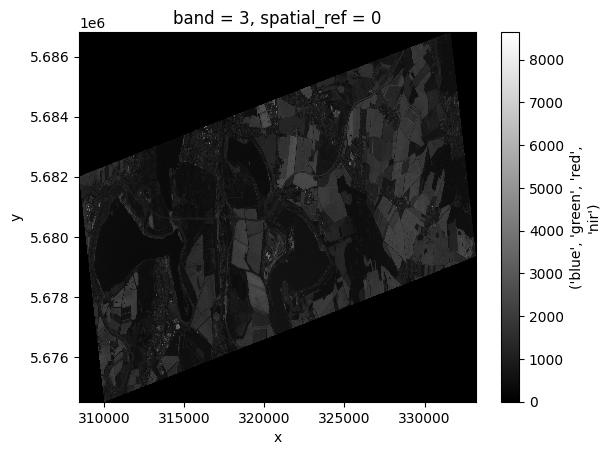

In [32]:
#plot image
xda.sel(band=3).plot.imshow(cmap="gray")

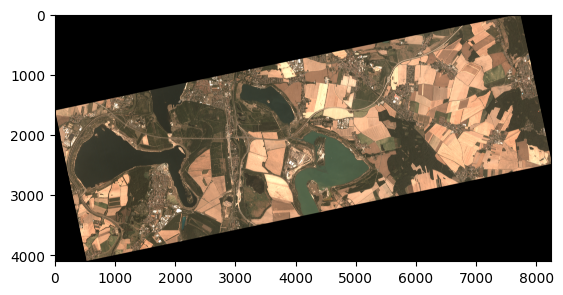

In [ ]:
#stack band dims
rgb = np.stack([xda.sel(band=3), xda.sel(band=2), xda.sel(band=1)], axis=-1)

# Normalize (stretch to 0-1 range)
rgb = np.clip(rgb / np.percentile(rgb, 98), 0, 1)

plt.imshow(rgb)
plt.show()

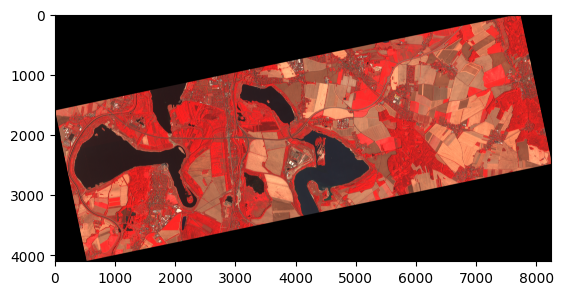

In [40]:
#false color composite
rgb = np.stack([xda.sel(band=4), xda.sel(band=3), xda.sel(band=2)], axis=-1)
rgb = np.clip(rgb / np.percentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()

In [47]:
def readPlanetScopetoXarrayDS(filepath:str):
    """
    Read PlanetScope tif files to xarray dataset and attach metadata.
    
    args:
    filepath: str, path to the tif file    
    """

    xda=rxr.open_rasterio(filepath)

    #clip to bbox
    xda = xda.rio.clip([bbox_gdf.geometry.iloc[0]], bbox_gdf.crs)

    # rename bands to ['blue', 'green', 'red', 'nir']
    xda=xda.rename({"band": "channel"})
    xda=xda.assign_coords(channel=["blue", "green", "red", "nir"])

    #remove spatial_ref and band coords
    xda=xda.drop_vars(["spatial_ref"])

    #add attributes
    xda=xda.assign_attrs(
        scale_factor= 0.0001,  # From Planet docs
        add_offset= 0.0,
        units= 'reflectance',
        description= 'Analysis-Ready PlanetScope Surface Reflectance'
    )

    #rename variable
    xda=xda.rename("planetscope_sr_4band")

    tiff_datetime = xda.attrs["TIFFTAG_DATETIME"]  # "2019:07:27 08:10:45"
    # Replace colons in date part with dashes
    tiff_datetime = tiff_datetime.replace(":", "-", 2)

    xda = xda.expand_dims(time=[np.datetime64(tiff_datetime)])
    
    #remove attrs
    xda.attrs.pop("TIFFTAG_DATETIME", None)
    
    
    #add another variable from TIFFTAG_IMAGEDESCRIPTION
    image_description = xda.attrs["TIFFTAG_IMAGEDESCRIPTION"]
    xda.attrs.pop("TIFFTAG_IMAGEDESCRIPTION", None)
    xds=xda.to_dataset()
    xds["meta_planetscope_sr_4band"] = xr.DataArray([image_description], dims=["time"])
    
    return xds

#read all files
#xds=readPlanetScopetoXarrayDS(collection_files[0])
xds_list=[readPlanetScopetoXarrayDS(file) for file in collection_files]

Merge datasets into one

In [ ]:
xds_list

In [ ]:
#sort xds_list by time
xds_list.sort(key=lambda x: x.time.values[0])

# merge datasets
xds=xr.concat(xds_list, dim="time")

#merge duplicated time values
xds=xds.groupby("time").mean()
xds

<xarray.Dataset> Size: 8GB
Dimensions:                    (time: 17, channel: 4, y: 5635, x: 5544)
Coordinates:
  * x                          (x) float64 44kB 3.097e+05 ... 3.263e+05
  * y                          (y) float64 45kB 5.683e+06 5.683e+06 ... 5.7e+06
  * channel                    (channel) <U5 80B 'blue' 'green' 'red' 'nir'
  * time                       (time) datetime64[s] 136B 2019-07-25T08:13:36 ...
Data variables:
    planetscope_sr_4band       (time, channel, y, x) float32 8GB nan nan ... nan
    meta_planetscope_sr_4band  (time) <U863 59kB '{"atmospheric_correction": ...

Test plot

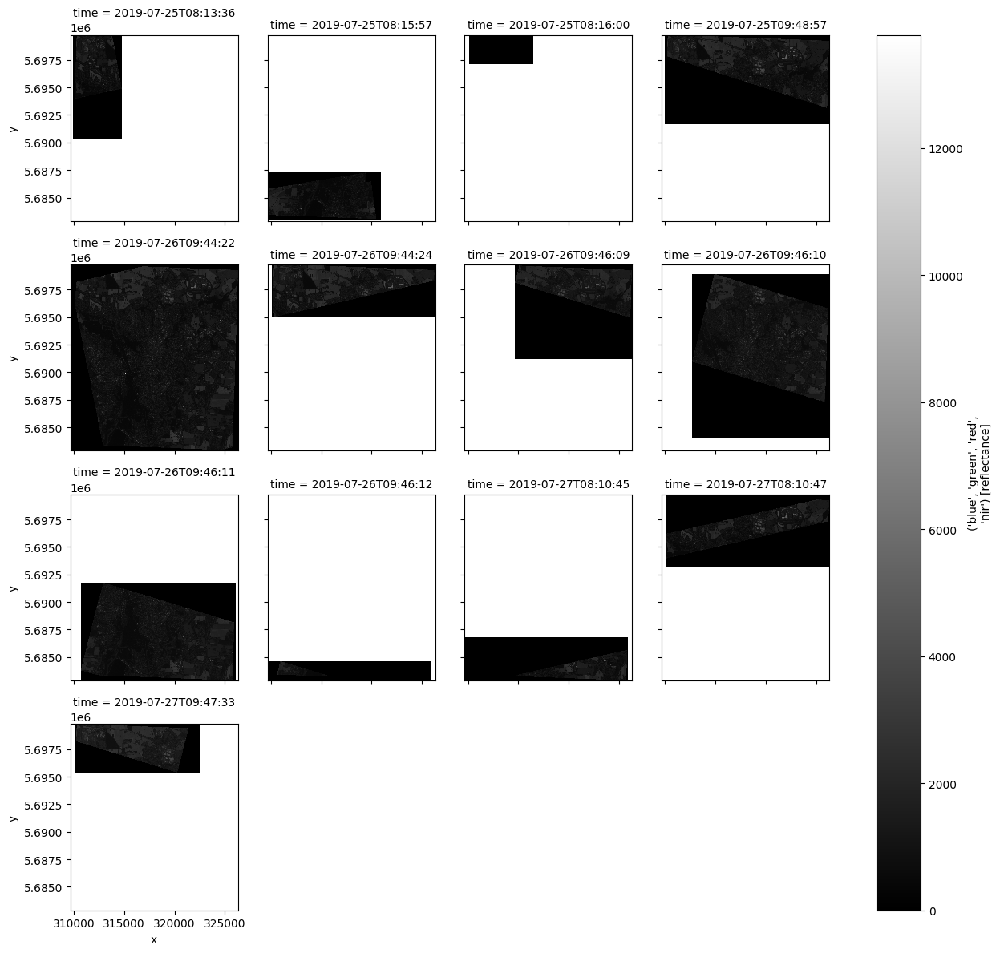

In [55]:
xds.planetscope_sr_4band.sel(channel="red").plot.imshow(col="time", col_wrap=4, cmap="gray")

Save to zarr

In [56]:
#save as zarr dataset
xds.to_zarr(f"{repo_dir}/data/planet_scope_{scene_date}.zarr", mode='w')

Combine collection dates into one image

In [ ]:
#read zarr dataset
xds=xr.open_zarr(f"{repo_dir}/data/planet_scope_{scene_date}.zarr")

#combine all timestamps into one image
xds_combined = xds.mean(dim="time", skipna=True)
#xds_combined = xds.median(dim="time", skipna=True)
#xds_combined = xds.max(dim="time", skipna=True)
#xds_combined = xds.reduce(np.percentile, dim="time", q=75)
xds_combined

<xarray.Dataset> Size: 1000MB
Dimensions:               (channel: 4, y: 5635, x: 5544)
Coordinates:
  * channel               (channel) object 32B 'blue' 'green' 'red' 'nir'
  * y                     (y) float64 45kB 5.683e+06 5.683e+06 ... 5.7e+06
  * x                     (x) float64 44kB 3.097e+05 3.097e+05 ... 3.263e+05
Data variables:
    planetscope_sr_4band  (channel, y, x) float64 1000MB nan nan nan ... nan nan

In [ ]:
#replace time value for time dim
scene_date_np=np.datetime64(pd.to_datetime(scene_date))
#xds_combined = xds_combined.assign_coords(time=[scene_date_np])
xds_combined = xds_combined.expand_dims(time=[scene_date_np])
xds_combined

<xarray.Dataset> Size: 1000MB
Dimensions:               (time: 1, channel: 4, y: 5635, x: 5544)
Coordinates:
  * channel               (channel) object 32B 'blue' 'green' 'red' 'nir'
  * y                     (y) float64 45kB 5.683e+06 5.683e+06 ... 5.7e+06
  * x                     (x) float64 44kB 3.097e+05 3.097e+05 ... 3.263e+05
  * time                  (time) datetime64[us] 8B 2019-07-26
Data variables:
    planetscope_sr_4band  (time, channel, y, x) float64 1000MB nan nan ... nan

In [74]:
xds_combined.to_zarr(f"{repo_dir}/data/planet_scope_{scene_date}_combined.zarr", mode='w')

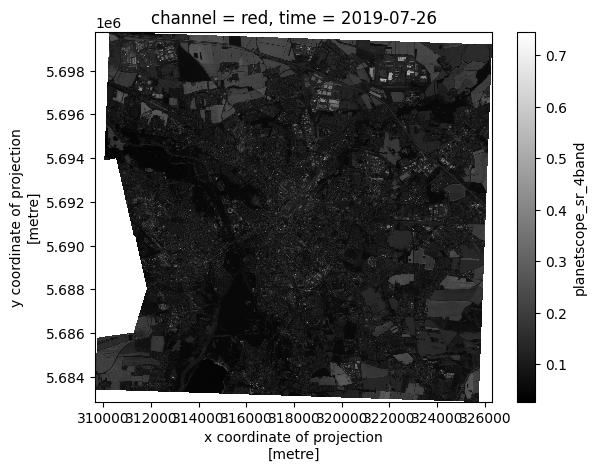

In [83]:
xds_combined=xr.open_zarr(f"{repo_dir}/data/planet_scope_{scene_date}_combined.zarr")

xds_combined.sel(time=scene_date_np).planetscope_sr_4band.sel(channel="red").plot.imshow(cmap="gray")

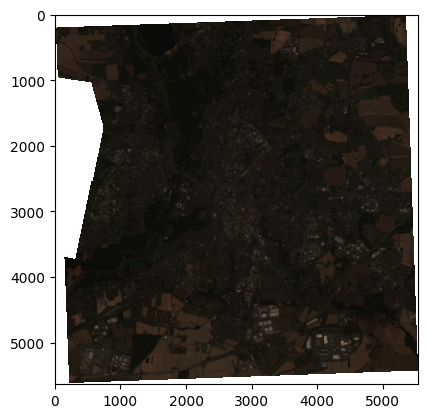

In [ ]:
#stack band dims
reflectance=xds_combined.planetscope_sr_4band.sel(time=scene_date_np)
rgb = np.stack([reflectance.sel(channel="red"), reflectance.sel(channel="green"), reflectance.sel(channel="blue")], axis=-1)
plt.imshow(rgb)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028050000000000002..2.3493500000000003].


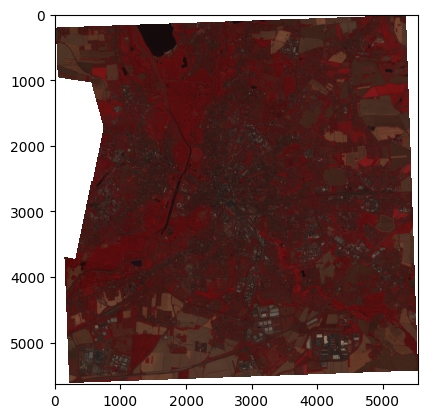

In [94]:
#false color composite
rgb = np.stack([reflectance.sel(channel="nir"), reflectance.sel(channel="red"), reflectance.sel(channel="green")], axis=-1)
plt.imshow(rgb)
plt.show()

### Create Cube using Xarray

### Request Landsat C2 L2 via planetary computer
https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2

In [19]:
import pystac_client
import planetary_computer

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [24]:
landsat = catalog.get_collection("landsat-c2-l2")

pd.DataFrame(landsat.summaries.get_list("eo:bands"))

,name,common_name,description,center_wavelength,full_width_half_max
0,TM_B1,blue,Visible blue (Thematic Mapper),0.49,0.07
1,TM_B2,green,Visible green (Thematic Mapper),0.56,0.08
2,TM_B3,red,Visible red (Thematic Mapper),0.66,0.06
3,TM_B4,nir08,Near infrared (Thematic Mapper),0.83,0.14
4,TM_B5,swir16,Short-wave infrared (Thematic Mapper),1.65,0.20
5,TM_B6,lwir,Long-wave infrared (Thematic Mapper),11.45,2.10
6,TM_B7,swir22,Short-wave infrared (Thematic Mapper),2.22,0.27
7,ETM_B1,blue,Visible blue (Enhanced Thematic Mapper Plus),0.48,0.07
8,ETM_B2,green,Visible green (Enhanced Thematic Mapper Plus),0.56,0.08
9,ETM_B3,red,Visible red (Enhanced Thematic Mapper Plus),0.66,0.06


In [25]:
pd.DataFrame.from_dict(landsat.extra_fields["item_assets"], orient="index")[
    ["title", "description", "gsd"]
]

,title,description,gsd
qa,Surface Temperature Quality Assessment Band,Collection 2 Level-2 Quality Assessment Band (...,NaN
ang,Angle Coefficients File,Collection 2 Level-1 Angle Coefficients File,NaN
red,Red Band,NaN,NaN
blue,Blue Band,NaN,NaN
drad,Downwelled Radiance Band,Collection 2 Level-2 Downwelled Radiance Band ...,NaN
emis,Emissivity Band,Collection 2 Level-2 Emissivity Band (ST_EMIS)...,NaN
emsd,Emissivity Standard Deviation Band,Collection 2 Level-2 Emissivity Standard Devia...,NaN
lwir,Surface Temperature Band,Collection 2 Level-2 Thermal Infrared Band (ST...,NaN
trad,Thermal Radiance Band,Collection 2 Level-2 Thermal Radiance Band (ST...,NaN
urad,Upwelled Radiance Band,Collection 2 Level-2 Upwelled Radiance Band (S...,NaN


In [39]:
time_range = "2020-12-01/2020-12-31"
bbox_lz = [xmin, ymin, xmax, ymax]

search = catalog.search(collections=["landsat-c2-l2"], bbox=bbox_lz)
items = search.get_all_items()

planetary_computer_df = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
planetary_computer_df.head()

,geometry,gsd,created,sci:doi,datetime,platform,proj:shape,description,instruments,eo:cloud_cover,...,landsat:scene_id,landsat:wrs_path,landsat:wrs_type,view:sun_azimuth,landsat:correction,view:sun_elevation,landsat:cloud_cover_land,landsat:collection_number,landsat:collection_category,proj:code
0,"POLYGON ((11.83128 52.75733, 11.11751 51.05878...",30,2025-02-27T09:15:57.698391Z,10.5066/P9OGBGM6,2025-02-24T10:03:04.248729Z,landsat-9,"[8141, 8061]",Landsat Collection 2 Level-2,"[oli, tirs]",46.22,...,LC91930242025055LGN00,193,2,158.103507,L2SP,26.681177,46.22,02,T1,EPSG:32633
1,"POLYGON ((11.83064 52.76001, 11.11688 51.06118...",30,2025-02-27T09:15:56.773108Z,10.5066/P9OGBGM6,2025-02-16T10:02:56.465874Z,landsat-8,"[8151, 8061]",Landsat Collection 2 Level-2,"[oli, tirs]",49.18,...,LC81930242025047LGN00,193,2,158.587189,L2SP,23.824218,49.18,02,T1,EPSG:32633
2,"POLYGON ((10.27623 52.75774, 9.56285 51.05881,...",30,2025-02-23T09:13:45.033600Z,10.5066/P9OGBGM6,2025-02-15T10:09:19.482916Z,landsat-9,"[7871, 7781]",Landsat Collection 2 Level-2,"[oli, tirs]",94.79,...,LC91940242025046LGN00,194,2,158.693523,L2SP,23.492544,94.79,02,T2,EPSG:32632
3,"POLYGON ((11.84418 52.7574, 11.13079 51.05868,...",30,2025-02-11T09:34:09.959775Z,10.5066/P9OGBGM6,2025-02-08T10:03:05.153703Z,landsat-9,"[8141, 8061]",Landsat Collection 2 Level-2,"[oli, tirs]",11.66,...,LC91930242025039LGN00,193,2,159.258275,L2SP,21.225046,11.66,02,T1,EPSG:32633
4,"POLYGON ((10.28519 52.76007, 9.57101 51.06119,...",30,2025-02-19T09:21:48.645376Z,10.5066/P9OGBGM6,2025-02-07T10:09:11.492884Z,landsat-8,"[7881, 7781]",Landsat Collection 2 Level-2,"[oli, tirs]",95.37,...,LC81940242025038LGN00,194,2,159.317154,L2SP,20.913884,95.37,02,T2,EPSG:32632


In [43]:
import pystac
selected_item = items[0]

item = pystac.read_file(selected_item.get_self_href())
signed_item = planetary_computer.sign(item)

response = requests.get(signed_item.assets["lwir11"].href)
response.raise_for_status()

with open(f"{repo_dir}/data/landsat_temperature/ms_planetary_{item.id}.tif", "wb") as f:
    f.write(response.content)

In [56]:
landsat.assets["geoparquet-items"]

<Asset href=abfs://items/landsat-c2-l2.parquet>

In [ ]:
storage_options = landsat.assets["geoparquet-items"].extra_fields["table:storage_options"]

# Read the parquet file
gdf = gpd.read_parquet(
    landsat.assets["geoparquet-items"].href,
    storage_options=storage_options
)